# **Engineering Capstone Project**
## **Assessment of Global Hydrological Model Performance in Estimating Terrestrial Water Storage in the Murray-Darling Basin**
#### Natasha Marsden | 1318593
#### Arfaa Feezanul Islam | 1423316
#### Jun Liu | 1419282

## **Overview of Methodology**

### *Study Area*
- Study area is the **Murray-Darling Basin (MDB)**.
- Analysis conducted on whole MDB as well as sub-regions.
- Four geographically defined sub-basins: **Northeast MDB, Northwest MDB, Southeast MDB, Southwest MDB**

### *Water Balance Model* 

**Water Balance Equation**:
ΔTWS = P - ET - Q
- ΔTWS: Change in Terrestrial Water Storage
- P: Precipitation
- ET: Evapotranspiration
- Q: Runoff

**2 Sources of P**: 
- ERA5-Land
- AWRA-L

**4 Sources of ET**:
- ERA5-Land
- AWRA-L
- MODIS
- CMRSET

**Source of Q**: Directly use data from BOM gauges at outlet of each basin

**8 Combinations of E and PT to be tested** (All using same Q): 
| Combination Number | ET | P | Q |
| -------- | ------- | ------ | ----- |
| 1  | ERA5-Land    | ERA5-Land | Gauge Data |
| 2  | ERA5-Land    | AWRA-L | Gauge Data |
| 3  | ERA5-Land    | MODIS | Gauge Data |
| 4  | ERA5-Land    | CMRSET | Gauge Data |
| 5  | AWRA-L    | ERA5-Land | Gauge Data |
| 6  | AWRA-L    | AWRA-L | Gauge Data |
| 7  | AWRA-L    | MODIS | Gauge Data |
| 8  | AWRA-L    | CMRSET | Gauge Data |

In [1]:
# import all necessary libraries

import functions

import geopandas as gpd
import xarray
import rioxarray
from shapely.geometry import mapping

import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

import cartopy.crs as ccrs

import pandas as pd
from datetime import datetime

import os

from sklearn.metrics import mean_squared_error

import matplotlib.patches as mpatches
import matplotlib.lines as mlines
import matplotlib.ticker as mticker

from shapely.geometry import Point

from scipy.stats import pearsonr

import matplotlib.gridspec as gridspec

import matplotlib.dates as mdates
import contextily as ctx


### **Define Study Area**

In [2]:
# import MDB and subregion boundaries 
MDB_shape = gpd.read_file('MDB_Regions/MDB_Whole.shp')
MDB_northeast_shape = gpd.read_file('MDB_Regions/MDB_Northeast_Region.shp')
MDB_northwest_shape = gpd.read_file('MDB_Regions/MDB_Northwest_Region.shp')
MDB_southeast_shape = gpd.read_file('MDB_Regions/MDB_Southeast_Region.shp')
MDB_southwest_shape = gpd.read_file('MDB_Regions/MDB_Southwest_Region.shp')
MDB_regions_combined = gpd.read_file('MDB_Regions/MDB_Regions_Combined.shp')

In [3]:
# import MDB river water course lines
rivers_MDB = gpd.read_file('Runoff/River-water-course-lines/river-water-course-lines_mdb_clipped.shp')
rivers_MDB = rivers_MDB.to_crs(MDB_shape.crs)

In [4]:
# import MDB gauge stations selected for analysis 
selected_stations = gpd.read_file('Runoff/Selected Stations/Selected Stations.shp')
selected_stations = selected_stations.rename(columns={'Station_Na': 'Station_Name'})
selected_stations = selected_stations.rename(columns={'Station_Ty': 'Station_Type'})
primary_stations = selected_stations[selected_stations["Station_Type"]=="Primary"]
secondary_stations = selected_stations[selected_stations["Station_Type"]=="Secondary"]

In [5]:
MDB_regions_combined_3857 = MDB_regions_combined.to_crs(epsg=3857)
rivers_MDB_3857 = rivers_MDB.to_crs(epsg=3857)

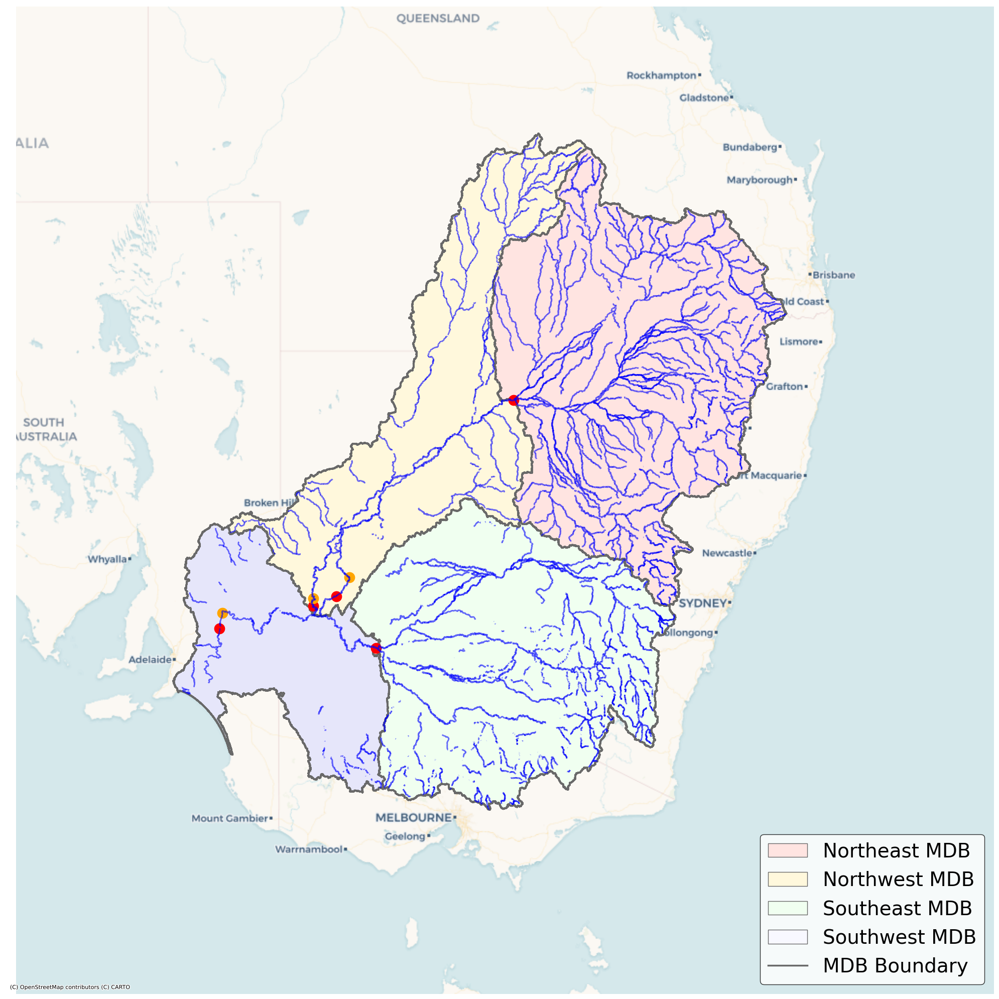

In [6]:
# plot map of MDB and subregions

fig, ax = plt.subplots(figsize=(30, 20))#, subplot_kw={'projection': ccrs.PlateCarree()})
colors = ["mistyrose", "cornsilk", "honeydew", "lavender"]

#ax.set_title("Murray–Darling Basin and Sub-Basins", fontsize = 24)
MDB_regions_combined_3857.plot(ax=ax, color=colors, edgecolor='dimgrey', linewidth=2.5)
rivers_MDB_3857.plot(ax=ax, color='blue', linewidth=2, alpha=0.6, label="Major Rivers")

#ax.coastlines(resolution='50m', color='black', linewidth=1.5)
#ax.set_extent([110, 160, -45, -10], crs=ccrs.PlateCarree())
#ax.gridlines(draw_labels=False)

primary_stations.to_crs(epsg=3857).plot(ax=ax, color='red', markersize=200, linewidth=1.5, label="Primary Gauges")
secondary_stations.to_crs(epsg=3857).plot(ax=ax, color='orange', markersize=200, linewidth=1.5, label="Secondary Gauges")

legend_patches = [
    mpatches.Patch(facecolor='mistyrose', label='Northeast MDB', edgecolor='dimgrey', linewidth=1),
    mpatches.Patch(facecolor='cornsilk', label='Northwest MDB', edgecolor='dimgrey', linewidth=1),
    mpatches.Patch(facecolor='honeydew', label='Southeast MDB', edgecolor='dimgrey', linewidth=1),
    mpatches.Patch(facecolor='ghostwhite', label='Southwest MDB', edgecolor='dimgrey', linewidth=1)
]
legend_lines = [
    mlines.Line2D([], [], color='dimgrey', linewidth=2.5, label='MDB Boundary')]

ax.legend(handles=legend_patches + legend_lines, loc='lower right', fontsize=28, frameon=True, fancybox=True, edgecolor='black', facecolor='white', framealpha=0.8)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Voyager)
ax.axis('off')
ax.set_xlim([15000000, 17500000])
ax.set_ylim([-5000000, -2500000])

plt.tight_layout()
plt.show()

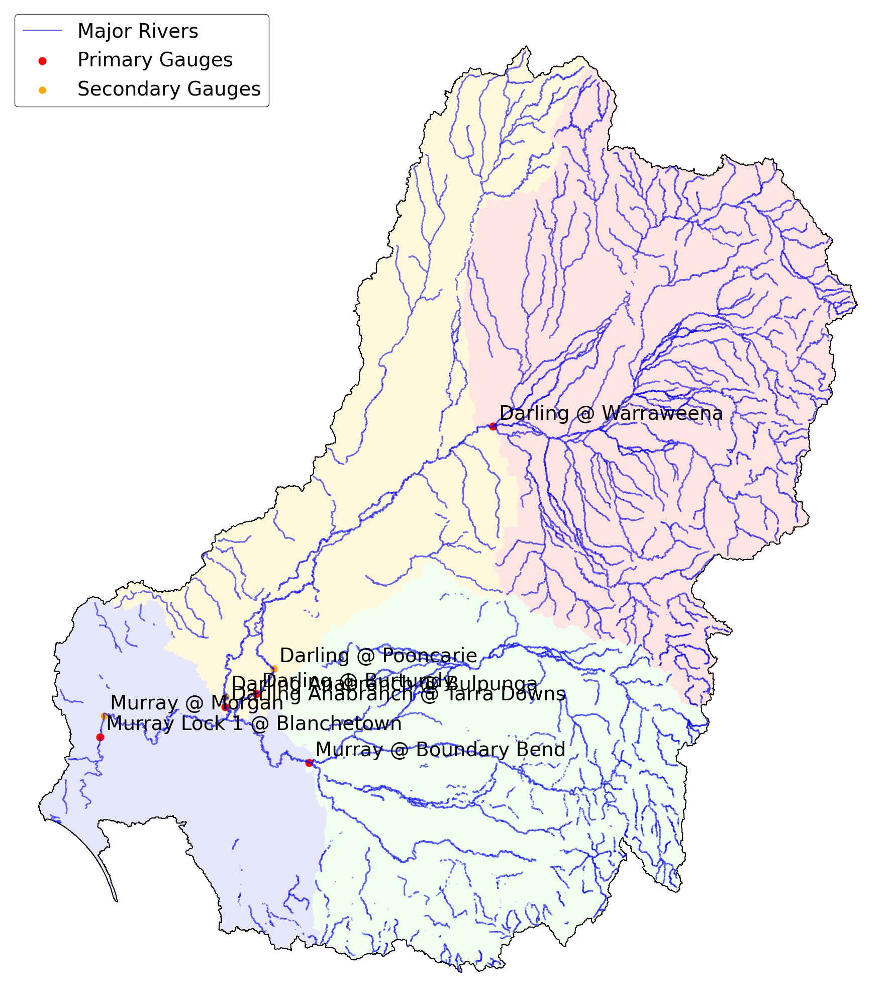

In [7]:
# plot map of MDB with major rivers and runoff gauge locations

fig, ax = plt.subplots(figsize=(30, 20), subplot_kw={'projection': ccrs.PlateCarree()})
#ax.set_title("Murray–Darling Basin Major Rivers and Runoff Gauges", fontsize = 24)

MDB_regions_combined.plot(ax=ax, color=colors, linewidth=2.5)
MDB_shape.plot(ax=ax, color='none', edgecolor='black')
rivers_MDB.plot(ax=ax, color='blue', linewidth=2, alpha=0.6, label="Major Rivers")
primary_stations.plot(ax=ax, color='red', markersize=100, linewidth=1.5, label="Primary Gauges")
secondary_stations.plot(ax=ax, color='orange', markersize=80, linewidth=1.5, label="Secondary Gauges")


for idx, row in selected_stations.iterrows():    
    ax.text(row.geometry.x + 0.1, row.geometry.y + 0.1, str(row['Station_Name']),
            fontsize=28, color='black')

ax.set_extent([138, 153, -38, -24], crs=ccrs.PlateCarree())

#ax.gridlines(draw_labels=False)
ax.legend(fontsize=28, frameon=True, fancybox=True, edgecolor='black', facecolor='white', framealpha=0.8, loc=2)
ax.axis('off')
plt.tight_layout()
plt.show()

### **Import Processed Data**

In [8]:
combined_data_ne=xarray.open_dataset('Processed Data/XArrays/ne_combined.nc')
combined_data_nw=xarray.open_dataset('Processed Data/XArrays/nw_combined.nc')
combined_data_se=xarray.open_dataset('Processed Data/XArrays/se_combined.nc')
combined_data_sw=xarray.open_dataset('Processed Data/XArrays/sw_combined.nc')
#combined_data_MDB=xarray.open_dataset('Processed Data/XArrays/MDB_combined.nc')

In [9]:
def add_tws_model_variants(ds):
    ds["TWS_ERA5_p_ERA5_et"] = ds["ERA5_p"] - ds["ERA5_et"] - ds["Runoff"]
    ds["TWS_AWRA_p_AWRA_et"] = ds["AWRA_p"] - ds["AWRA_et"] - ds["Runoff"]
    ds["TWS_ERA5_p_AWRA_et"] = ds["ERA5_p"] - ds["AWRA_et"] - ds["Runoff"]
    ds["TWS_AWRA_p_ERA5_et"] = ds["AWRA_p"] - ds["ERA5_et"] - ds["Runoff"]
    ds["TWS_ERA5_p_CMRSET_et"] = ds["ERA5_p"] - ds["CMRSET_et"] - ds["Runoff"]
    ds["TWS_AWRA_p_CMRSET_et"] = ds["AWRA_p"] - ds["CMRSET_et"] - ds["Runoff"]
    ds["TWS_ERA5_p_MODIS_et"] = ds["ERA5_p"] - ds["MODIS_et"] - ds["Runoff"]
    ds["TWS_AWRA_p_MODIS_et"] = ds["AWRA_p"] - ds["MODIS_et"] - ds["Runoff"]
    return ds

In [10]:
processed_data_ne = add_tws_model_variants(combined_data_ne)
processed_data_nw = add_tws_model_variants(combined_data_nw)
processed_data_se = add_tws_model_variants(combined_data_se)
processed_data_sw = add_tws_model_variants(combined_data_sw)
#processed_data_MDB = add_tws_model_variants(combined_data_MDB)

### **Plot Graphs**

In [11]:
dates = processed_data_ne.time

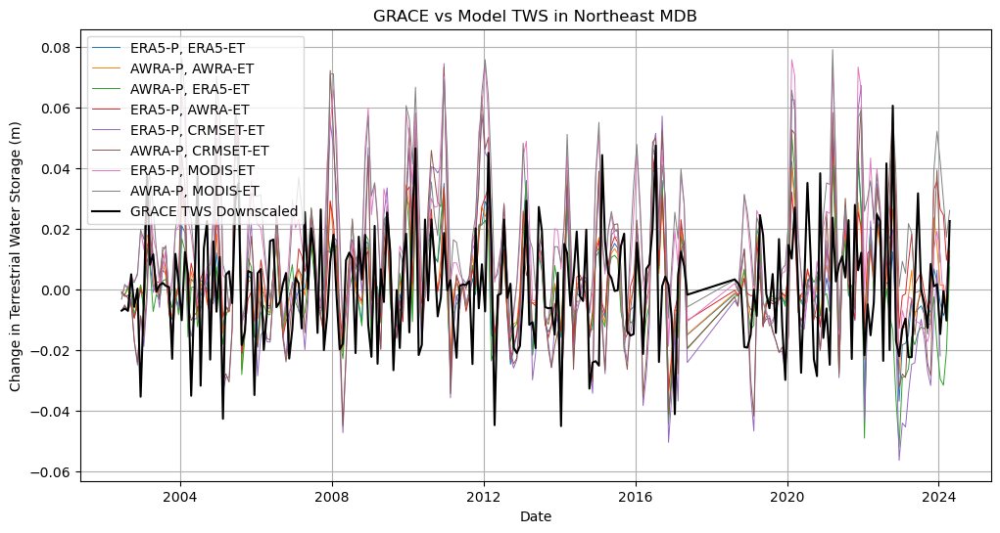

In [12]:
# Northeast

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_ne["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
plt.plot(dates, processed_data_ne["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

plt.plot(dates, processed_data_ne["GRACE_dTWS"], linewidth=1.5, label='GRACE TWS Downscaled', color='black')

plt.title('GRACE vs Model TWS in Northeast MDB')
plt.xlabel('Date')
plt.ylabel('Change in Terrestrial Water Storage (m)')
plt.legend()
plt.grid(True)
#plt.savefig("ne.png")
plt.show()

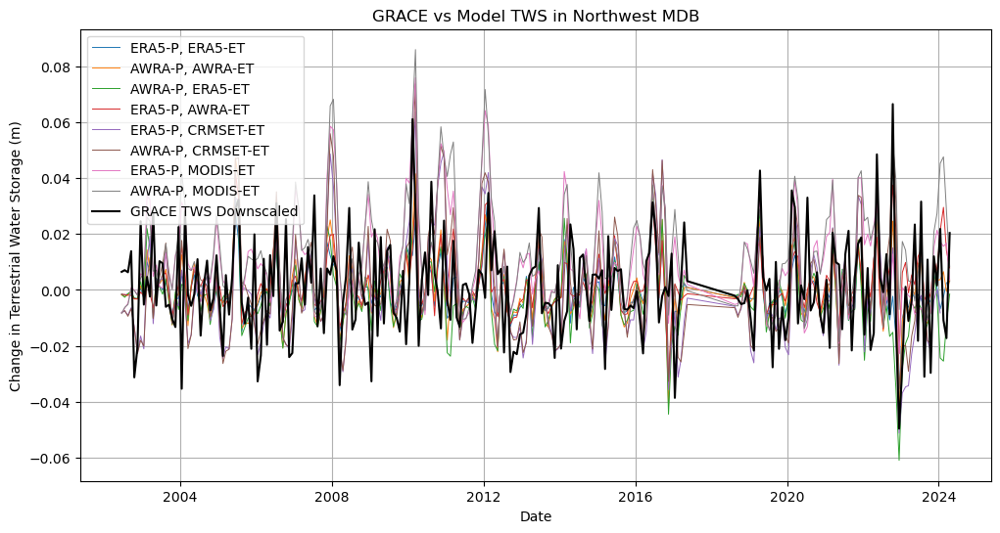

In [13]:
# Northwest

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_nw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
plt.plot(dates, processed_data_nw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

plt.plot(dates, processed_data_nw["GRACE_dTWS"], linewidth=1.5, label='GRACE TWS Downscaled', color='black')

plt.title('GRACE vs Model TWS in Northwest MDB')
plt.xlabel('Date')
plt.ylabel('Change in Terrestrial Water Storage (m)')
plt.legend()
plt.grid(True)
#plt.savefig("nw.png")
plt.show()

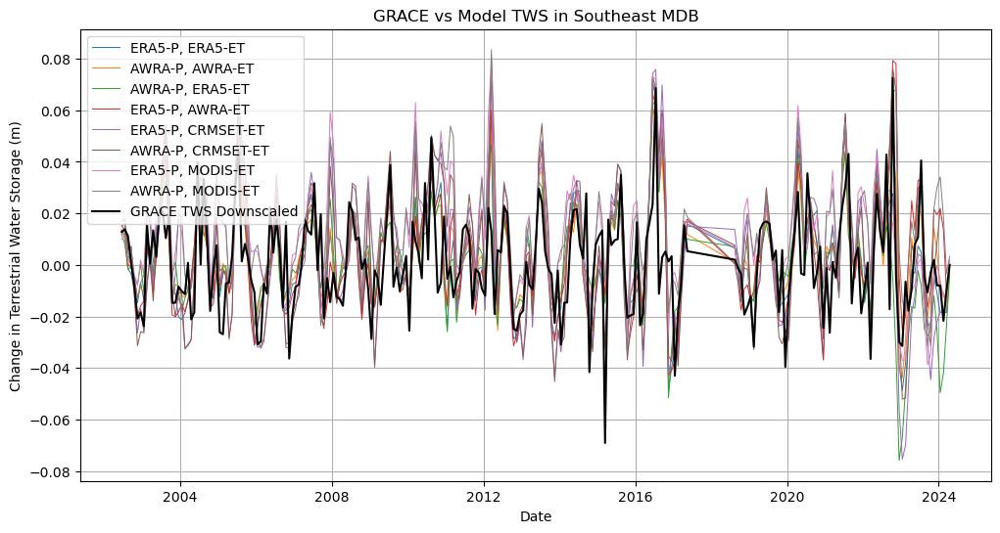

In [14]:
# Southeast

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_se["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
plt.plot(dates, processed_data_se["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

plt.plot(dates, processed_data_se["GRACE_dTWS"], linewidth=1.5, label='GRACE TWS Downscaled', color='black')

plt.title('GRACE vs Model TWS in Southeast MDB')
plt.xlabel('Date')
plt.ylabel('Change in Terrestrial Water Storage (m)')
plt.legend()
plt.grid(True)
#plt.savefig("se.png")
plt.show()

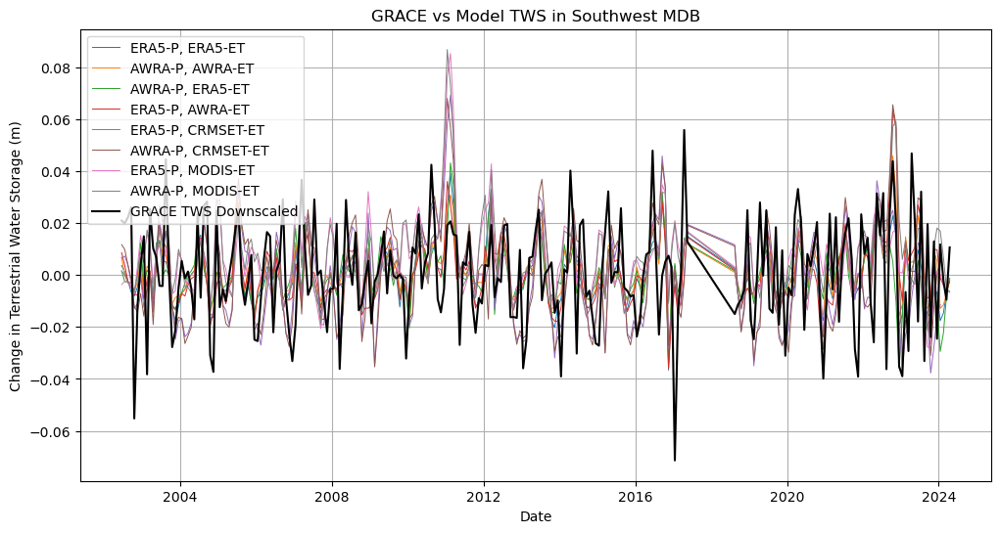

In [15]:
# Southwest

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_sw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
plt.plot(dates, processed_data_sw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

plt.plot(dates, processed_data_sw["GRACE_dTWS"], linewidth=1.5, label='GRACE TWS Downscaled', color='black')

plt.title('GRACE vs Model TWS in Southwest MDB')
plt.xlabel('Date')
plt.ylabel('Change in Terrestrial Water Storage (m)')
plt.legend()
plt.grid(True)
#plt.savefig("nw.png")
plt.show()

### **Compare Precipitation**

In [16]:
precip_data_ERA5=xarray.open_dataset('Processed Data/Models/ERA5-p.nc')
precip_data_awra=xarray.open_dataset('Processed Data/Models/AWRA-p.nc')

In [17]:
precip_data_ERA5=precip_data_ERA5["tp"]
precip_data_awra=precip_data_awra["rain_day"]

In [18]:
regions = ['Northeast', 'Northwest', 'Southeast', 'Southwest']
shapes = [MDB_northeast_shape, MDB_northwest_shape, MDB_southeast_shape, MDB_southwest_shape]

In [19]:
def mean_absolute_percentage_error(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    
    # Avoid division by zero
    non_zero = y_true != 0
    if not np.any(non_zero):
        return np.nan  # Or raise ValueError
    mape = np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    return mape

In [20]:
avg_p_era5_list = []
avg_p_awra_list = []

for i, (region, shape) in enumerate(zip(regions, shapes)):
    
    # Calculate spatial averages for each region
    avg_p_era5, dates_era5 = functions.calc_spatial_avg(precip_data_ERA5, shape)
    avg_p_awra, dates_awra = functions.calc_spatial_avg(precip_data_awra, shape)

    avg_p_era5_list.append(avg_p_era5)
    avg_p_awra_list.append(avg_p_awra)


In [21]:
for i, (region, avg_p_era5, avg_p_awra) in enumerate(zip(regions, avg_p_era5_list, avg_p_awra_list)):
    
    # RMSE
    rmse_precip = np.round(np.sqrt(mean_squared_error(avg_p_era5, avg_p_awra)), 4)
    
    # MAPE
    mape_precip = np.round(mean_absolute_percentage_error(avg_p_era5, avg_p_awra), 2)

    # avg p era5
    avg_p_era5_tot = np.round(np.nanmean(avg_p_era5), 3)

    # avg p awra
    avg_p_awra_tot = np.round(np.nanmean(avg_p_awra), 3)

    # Print Results
    print(f"--- {region} Precipitation ---")
    print(f"RMSE: {rmse_precip} m/month")
    print(f"MAPE: {mape_precip}%")
    print(f"Avg. P ERA5: {avg_p_era5_tot}")
    print(f"Avg. P AWRA: {avg_p_awra_tot}")
    print("\n")

--- Northeast Precipitation ---
RMSE: 0.0083 m/month
MAPE: 16.21%
Avg. P ERA5: 0.042
Avg. P AWRA: 0.045


--- Northwest Precipitation ---
RMSE: 0.0066 m/month
MAPE: 19.1%
Avg. P ERA5: 0.025
Avg. P AWRA: 0.028


--- Southeast Precipitation ---
RMSE: 0.0093 m/month
MAPE: 14.16%
Avg. P ERA5: 0.044
Avg. P AWRA: 0.045


--- Southwest Precipitation ---
RMSE: 0.0062 m/month
MAPE: 18.29%
Avg. P ERA5: 0.025
Avg. P AWRA: 0.026




In [69]:
# WITHOUT LAST 21 DATA POINTS

for i, (region, avg_p_era5, avg_p_awra) in enumerate(zip(regions, avg_p_era5_list, avg_p_awra_list)):
    
    # RMSE
    rmse_precip = np.round(np.sqrt(mean_squared_error(avg_p_era5[:-21], avg_p_awra[:-21])), 4)
    
    # MAPE
    mape_precip = np.round(mean_absolute_percentage_error(avg_p_era5[:-21], avg_p_awra[:-21]), 2)

    # avg p era5
    avg_p_era5_tot = np.round(np.nanmean(avg_p_era5[:-21]), 3)

    # avg p awra
    avg_p_awra_tot = np.round(np.nanmean(avg_p_awra[:-21]), 3)

    # Print Results
    print(f"--- {region} Precipitation ---")
    print(f"RMSE: {rmse_precip} m/month")
    print(f"MAPE: {mape_precip}%")
    print(f"Avg. P ERA5: {avg_p_era5_tot}")
    print(f"Avg. P AWRA: {avg_p_awra_tot}")
    print("\n")

--- Northeast Precipitation ---
RMSE: 0.0057 m/month
MAPE: 11.2%
Avg. P ERA5: 0.043
Avg. P AWRA: 0.044


--- Northwest Precipitation ---
RMSE: 0.0044 m/month
MAPE: 14.43%
Avg. P ERA5: 0.025
Avg. P AWRA: 0.027


--- Southeast Precipitation ---
RMSE: 0.005 m/month
MAPE: 8.82%
Avg. P ERA5: 0.045
Avg. P AWRA: 0.044


--- Southwest Precipitation ---
RMSE: 0.0041 m/month
MAPE: 14.28%
Avg. P ERA5: 0.025
Avg. P AWRA: 0.025




In [70]:
# ONLY LAST 21 DATA POINTS

for i, (region, avg_p_era5, avg_p_awra) in enumerate(zip(regions, avg_p_era5_list, avg_p_awra_list)):
    
    # RMSE
    rmse_precip = np.round(np.sqrt(mean_squared_error(avg_p_era5[-21:], avg_p_awra[-21:])), 4)
    
    # MAPE
    mape_precip = np.round(mean_absolute_percentage_error(avg_p_era5[-21:], avg_p_awra[-21:]), 2)

    # avg p era5
    avg_p_era5_tot = np.round(np.nanmean(avg_p_era5[-21:]), 3)

    # avg p awra
    avg_p_awra_tot = np.round(np.nanmean(avg_p_awra[-21:]), 3)

    # Print Results
    print(f"--- {region} Precipitation ---")
    print(f"RMSE: {rmse_precip} m/month")
    print(f"MAPE: {mape_precip}%")
    print(f"Avg. P ERA5: {avg_p_era5_tot}")
    print(f"Avg. P AWRA: {avg_p_awra_tot}")
    print("\n")

--- Northeast Precipitation ---
RMSE: 0.022 m/month
MAPE: 73.99%
Avg. P ERA5: 0.031
Avg. P AWRA: 0.049


--- Northwest Precipitation ---
RMSE: 0.0181 m/month
MAPE: 72.87%
Avg. P ERA5: 0.021
Avg. P AWRA: 0.035


--- Southeast Precipitation ---
RMSE: 0.0284 m/month
MAPE: 75.67%
Avg. P ERA5: 0.035
Avg. P AWRA: 0.059


--- Southwest Precipitation ---
RMSE: 0.0169 m/month
MAPE: 64.51%
Avg. P ERA5: 0.02
Avg. P AWRA: 0.033




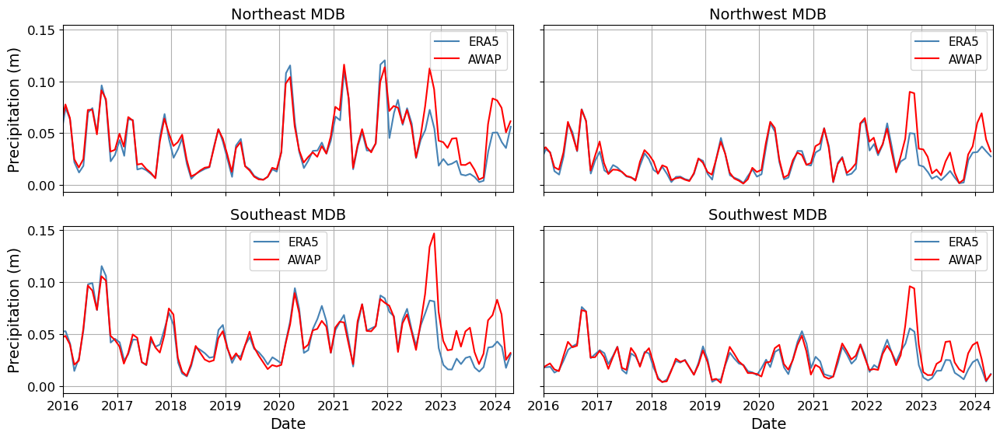

In [23]:
fig, axs = plt.subplots(2, 2, figsize=(13, 6), sharex=True, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2016")
xlim2 = pd.to_datetime("May 2024")

for i, (region, avg_p_era5, avg_p_awra) in enumerate(zip(regions, avg_p_era5_list, avg_p_awra_list)):

    # Plot on subplot
    axs[i].plot(dates_era5, avg_p_era5, label='ERA5', color='steelblue')
    axs[i].plot(dates_awra, avg_p_awra, label='AWAP', color='red')
    axs[i].set_title(f'{region} MDB', fontsize=14)
    axs[i].set_xlim(xlim1, xlim2)
    axs[i].grid(True)
    axs[i].legend(fontsize=11)

    if i >= 2:
        axs[i].set_xlabel('Date', fontsize=14)
    if i % 2 == 0:
        axs[i].set_ylabel('Precipitation (m)', fontsize=14)

    axs[i].tick_params(axis='both', which='major', labelsize=12)

#plt.suptitle('Spatially Averaged Precipitation in MDB Regions', fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
plt.show()

<xarray.DataArray 'time' (time: 1)> Size: 8B
array(['2022-08-16T12:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time         (time) datetime64[ns] 8B 2022-08-16T12:00:00
    spatial_ref  int64 8B 0


<xarray.DataArray 'time' (time: 1)> Size: 8B
array(['2024-04-16T12:00:00.000000000'], dtype='datetime64[ns]')
Coordinates:
  * time         (time) datetime64[ns] 8B 2024-04-16T12:00:00
    spatial_ref  int64 8B 0


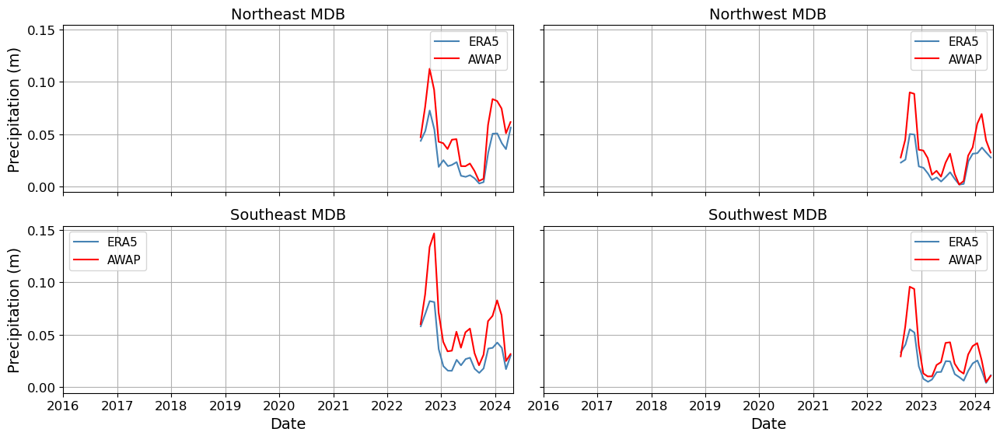

In [74]:
fig, axs = plt.subplots(2, 2, figsize=(13, 6), sharex=True, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2016")
xlim2 = pd.to_datetime("May 2024")

for i, (region, avg_p_era5, avg_p_awra) in enumerate(zip(regions, avg_p_era5_list, avg_p_awra_list)):

    # Plot on subplot
    axs[i].plot(dates_era5[-21:], avg_p_era5[-21:], label='ERA5', color='steelblue')
    axs[i].plot(dates_awra[-21:], avg_p_awra[-21:], label='AWAP', color='red')
    axs[i].set_title(f'{region} MDB', fontsize=14)
    axs[i].set_xlim(xlim1, xlim2)
    axs[i].grid(True)
    axs[i].legend(fontsize=11)

    if i >= 2:
        axs[i].set_xlabel('Date', fontsize=14)
    if i % 2 == 0:
        axs[i].set_ylabel('Precipitation (m)', fontsize=14)

    axs[i].tick_params(axis='both', which='major', labelsize=12)

print(dates_era5[-21:-20])
print("\n")
print(dates_era5[-1:])

#plt.suptitle('Spatially Averaged Precipitation in MDB Regions', fontsize=15)
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave space for suptitle
plt.show()

Precipitation observations:
- Both precipitation models appear very close to one another, except from 2022 onwards
- We know AWRA-P is fairly accurate because it is locally calibrated and incorporates high-quality, ground-based observations such as rain gauge data
- Thus, we conclude that ERA5-P is also quite accurate given its close proximity to ERA5, despite being a global reanalysis product
- ERA5-P is slightly more accurate in Western (wetter) basins comapred to eastern (more arid) basins (recalc error multiplciative)
- Neither model appears to be consistently greater than or less than the other prior to 2022
- We then can conclude that most of the error in the TWS estimate comes from the evapotranspiration estimates
- So, to compare ET from different products, we will look at TWS estimates primarily using AWRA-P because we assume it is the more reliable model

- Question: Why would ERA5 diverge from AWRA/over-estimate precipitation in recent years?

- Precipitation is multiplicative


## **Plot Ensemble**

In [24]:
ne_series_list = [processed_data_ne["TWS_ERA5_p_ERA5_et"], processed_data_ne["TWS_AWRA_p_AWRA_et"], processed_data_ne["TWS_ERA5_p_AWRA_et"], processed_data_ne["TWS_AWRA_p_ERA5_et"],
                  processed_data_ne["TWS_ERA5_p_CMRSET_et"], processed_data_ne["TWS_AWRA_p_CMRSET_et"], processed_data_ne["TWS_ERA5_p_MODIS_et"], processed_data_ne["TWS_AWRA_p_MODIS_et"]]

In [25]:
avg_p_awra_ne, dates_awra_ne = functions.calc_spatial_avg(precip_data_awra, MDB_northeast_shape)
avg_p_awra_nw, dates_awra_nw = functions.calc_spatial_avg(precip_data_awra, MDB_northwest_shape)
avg_p_awra_se, dates_awra_se = functions.calc_spatial_avg(precip_data_awra, MDB_southeast_shape)
avg_p_awra_sw, dates_awra_sw = functions.calc_spatial_avg(precip_data_awra, MDB_southwest_shape)


/Users/natashamarsden/Library/CloudStorage/OneDrive-SharedLibraries-TheUniversityofMelbourne/TWS in Changing Climate - Documents/Project_Main_Tasks/functions.py:186: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


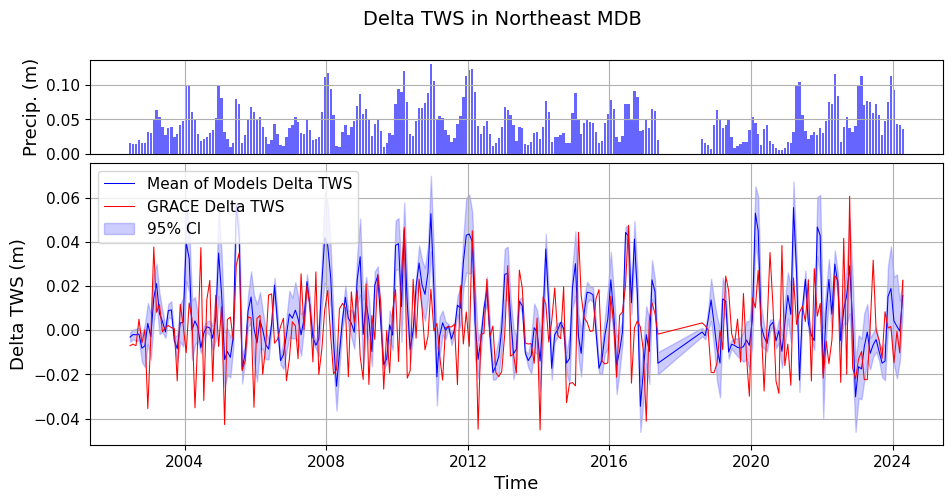

In [26]:
functions.ensemble_graph(ne_series_list, processed_data_ne["GRACE_dTWS"], dates, title = 'Delta TWS in Northeast MDB', precip = avg_p_awra_ne)

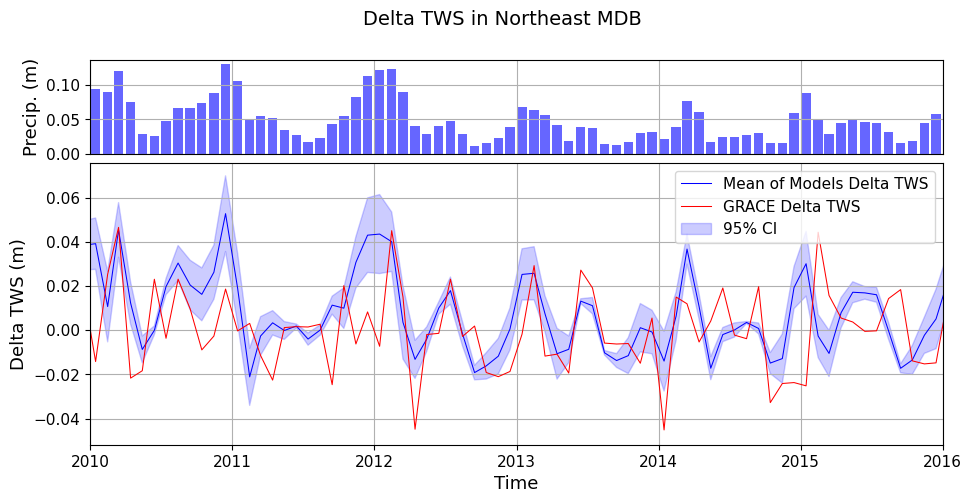

In [27]:
xlim1 = pd.to_datetime("2010")
xlim2 = pd.to_datetime("2016")

functions.ensemble_graph(ne_series_list, processed_data_ne["GRACE_dTWS"], dates, title = 'Delta TWS in Northeast MDB', xlim1=xlim1, xlim2=xlim2, precip = avg_p_awra_ne)

Northeast ensemble observations:
- GRACE estimates frequently fall outside of 95% CI
- In general, LSMs are not doing a great job predicting terrestrial water storage
- LSMs seem to have a hard time responding to changes in TWS over a monthly timestep
- GRACE TWS is often systematically below the model estimates (both the mean and often the 95% CI)

In [28]:
nw_series_list = [processed_data_nw["TWS_ERA5_p_ERA5_et"], processed_data_nw["TWS_AWRA_p_AWRA_et"], processed_data_nw["TWS_ERA5_p_AWRA_et"], processed_data_nw["TWS_AWRA_p_ERA5_et"],
                  processed_data_nw["TWS_ERA5_p_CMRSET_et"], processed_data_nw["TWS_AWRA_p_CMRSET_et"], processed_data_nw["TWS_ERA5_p_MODIS_et"], processed_data_nw["TWS_AWRA_p_MODIS_et"]]

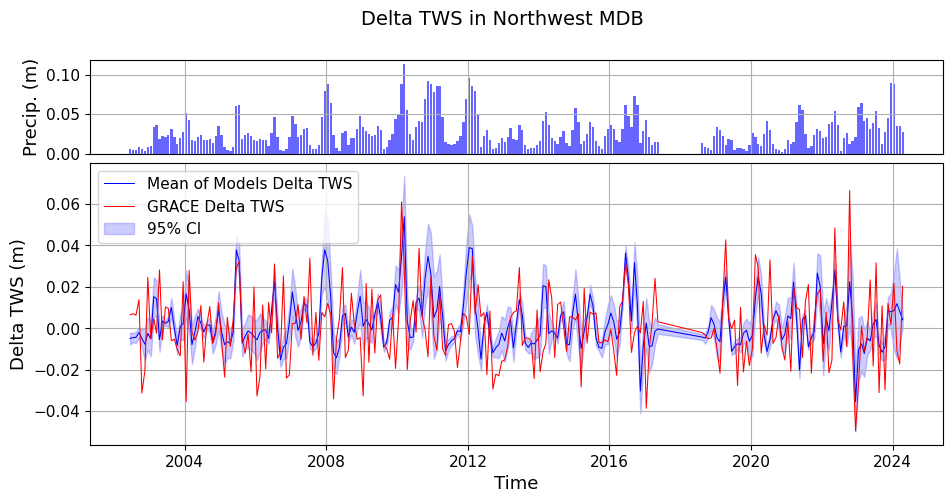

In [29]:
functions.ensemble_graph(nw_series_list, processed_data_nw["GRACE_dTWS"], dates, title = 'Delta TWS in Northwest MDB', precip = avg_p_awra_nw)

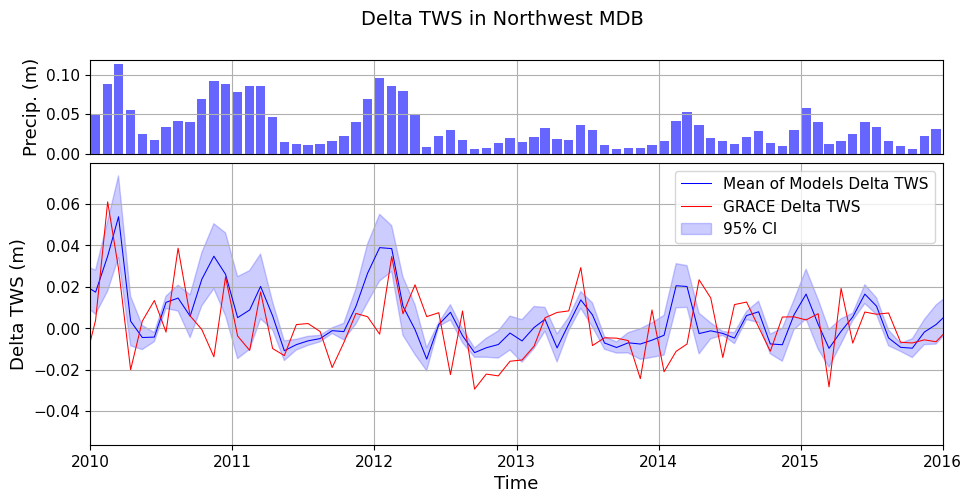

In [30]:
xlim1 = pd.to_datetime("2010")
xlim2 = pd.to_datetime("2016")
#plot precipitation above ensemble graph

functions.ensemble_graph(nw_series_list, processed_data_nw["GRACE_dTWS"], dates, title = 'Delta TWS in Northwest MDB', xlim1=xlim1, xlim2=xlim2, precip = avg_p_awra_nw)

Northwest Ensemble observations:
- Similar to Northeast in that GRACE is often outside the 95% CI
- Model estimates appear to go both above and below GRACE extremes fairly frequently, whereas in the NE basin model estimates often seemed like over-estimates

In [31]:
se_series_list = [processed_data_se["TWS_ERA5_p_ERA5_et"], processed_data_se["TWS_AWRA_p_AWRA_et"], processed_data_se["TWS_ERA5_p_AWRA_et"], processed_data_se["TWS_AWRA_p_ERA5_et"],
                  processed_data_se["TWS_ERA5_p_CMRSET_et"], processed_data_se["TWS_AWRA_p_CMRSET_et"], processed_data_se["TWS_ERA5_p_MODIS_et"], processed_data_se["TWS_AWRA_p_MODIS_et"]]

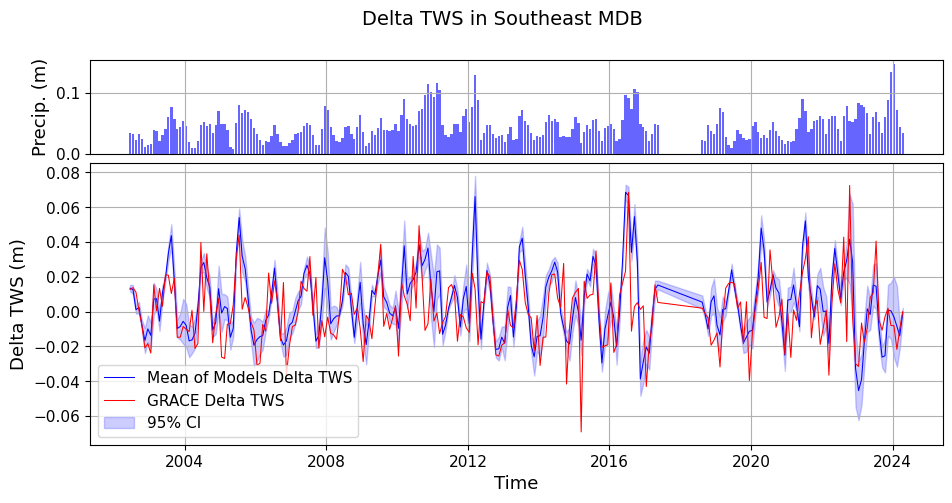

In [32]:
functions.ensemble_graph(se_series_list, processed_data_se["GRACE_dTWS"], dates, title = 'Delta TWS in Southeast MDB', precip = avg_p_awra_se)

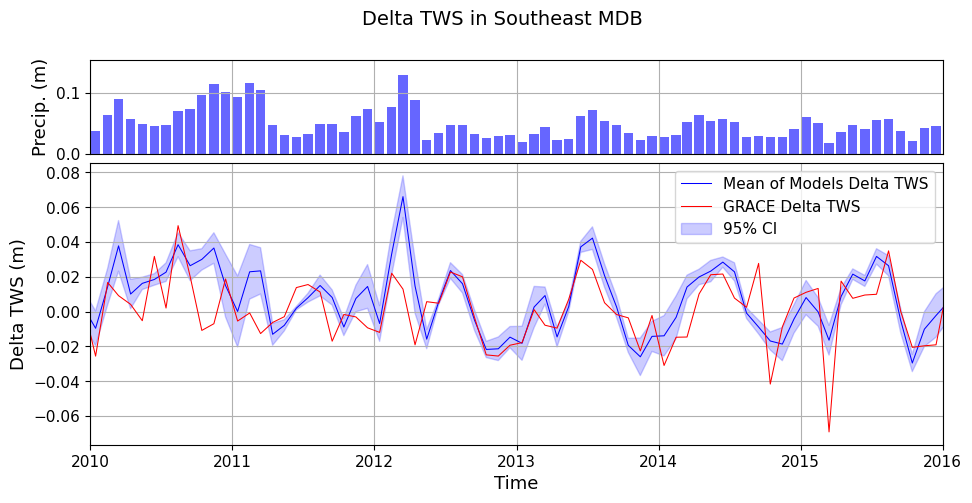

In [33]:
xlim1 = pd.to_datetime("2010")
xlim2 = pd.to_datetime("2016")

functions.ensemble_graph(se_series_list, processed_data_se["GRACE_dTWS"], dates, title = 'Delta TWS in Southeast MDB', xlim1=xlim1, xlim2=xlim2, precip = avg_p_awra_se)

Southeast ensemble observations:
- Model estimates appear more accurate here than in the other basins
- Short term trend of LSM averages seem to follow behavior of GRACE (mid 2012 to mid 2013, for example)
- Extrema are picked up more frequently by LSMs compared to other basins
- GRACE estimates still fall outside of 95% CI fairly often, but not as much as in other sub-basins
- This is the wettest of the four basins with the most elevation change, maybe the LSMs in this sub-basin are performing better because global models are not calibrated specifically for arid basins like the MDB, and thus are performing best in the wettest sub-basin with the most elevation change (most predictable behavior)

In [34]:
sw_series_list = [processed_data_sw["TWS_ERA5_p_ERA5_et"], processed_data_sw["TWS_AWRA_p_AWRA_et"], processed_data_sw["TWS_ERA5_p_AWRA_et"], processed_data_sw["TWS_AWRA_p_ERA5_et"],
                  processed_data_sw["TWS_ERA5_p_CMRSET_et"], processed_data_sw["TWS_AWRA_p_CMRSET_et"], processed_data_sw["TWS_ERA5_p_MODIS_et"], processed_data_sw["TWS_AWRA_p_MODIS_et"]]

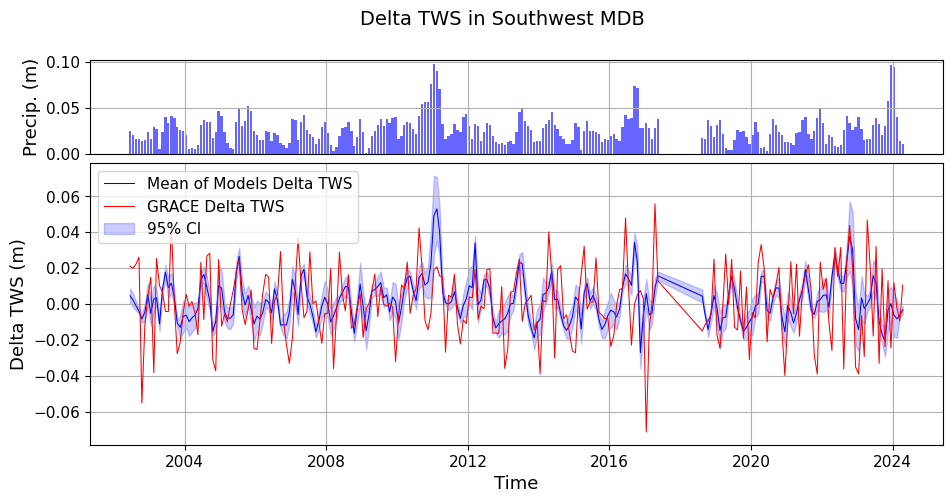

In [35]:
functions.ensemble_graph(sw_series_list, processed_data_sw["GRACE_dTWS"], dates, title = 'Delta TWS in Southwest MDB', precip = avg_p_awra_sw)

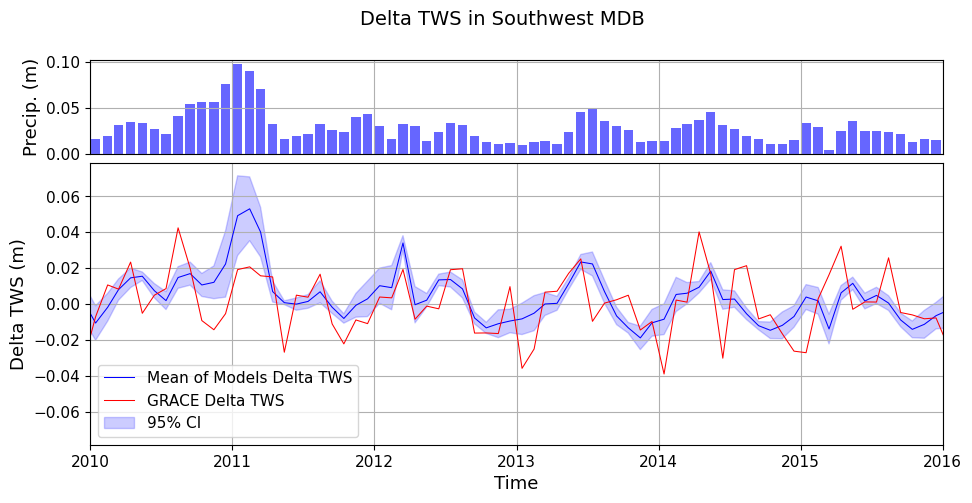

In [36]:
xlim1 = pd.to_datetime("2010")
xlim2 = pd.to_datetime("2016")

functions.ensemble_graph(sw_series_list, processed_data_sw["GRACE_dTWS"], dates, title = 'Delta TWS in Southwest MDB', xlim1=xlim1, xlim2=xlim2, precip = avg_p_awra_sw)

Southwest emsemble observations:
- Visually, the LSM estimates for this sub-basin appear to do the worst job matching GRACE out of all four sub-basins
- LSMs are not capturing the extremities in GRACE
- LSMs perform better when the TWS is between -0.01 and 0.01 m (which is somewhat uncommon)
- No consistent under- or over-estimation, just seems to lack extreme behavior 

### **Error Metrics**

### *Residuals*

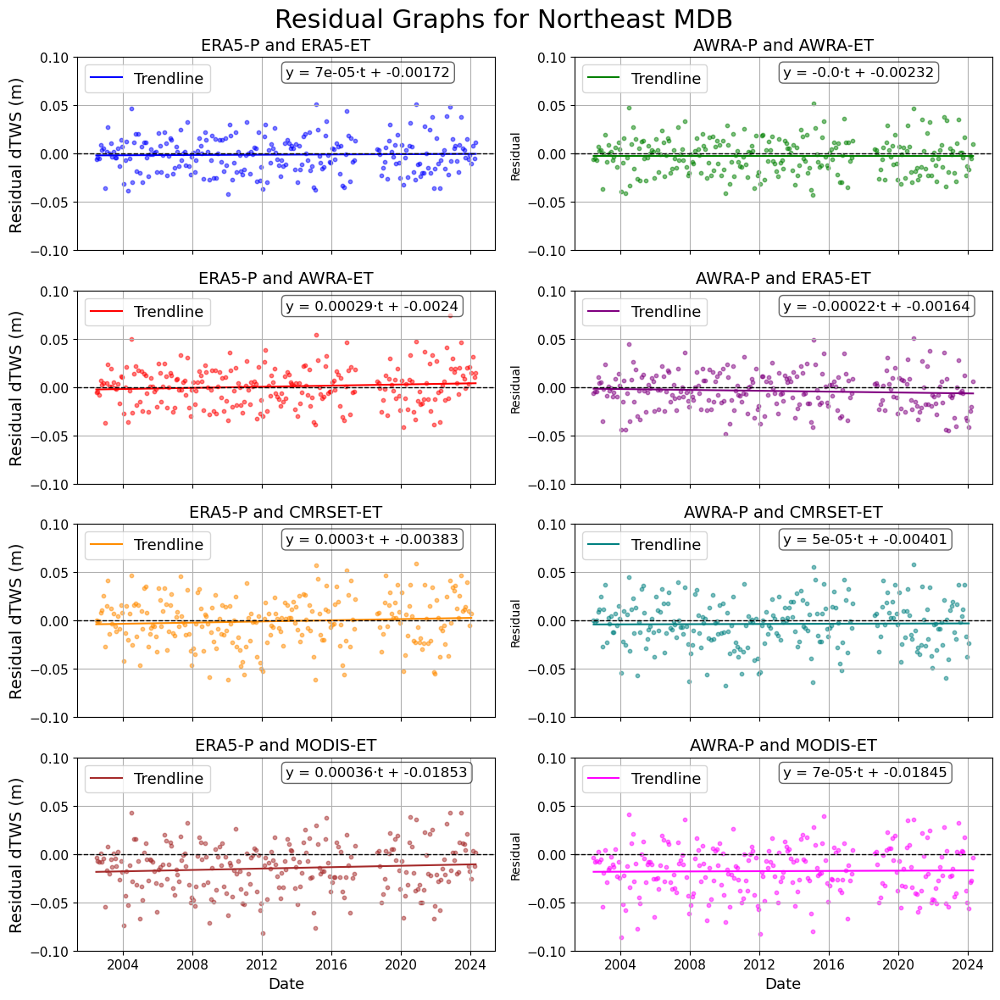

In [37]:
colors = ['blue', 'green', 'red', 'purple', 'darkorange', 'teal', 'brown', 'magenta']

series_list_names = ['ERA5-P and ERA5-ET', 'AWRA-P and AWRA-ET',
                     'ERA5-P and AWRA-ET', 'AWRA-P and ERA5-ET',
                     'ERA5-P and CMRSET-ET', 'AWRA-P and CMRSET-ET',
                     'ERA5-P and MODIS-ET', 'AWRA-P and MODIS-ET']

dates = pd.to_datetime(dates.values)  # Ensure dates are pandas datetime

n = len(ne_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12, rows * 3), sharex=True)
axs = axs.flatten()

for i in range(n):
    series = ne_series_list[i]
    name = series_list_names[i]
    trimmed = processed_data_ne["GRACE_dTWS"][:len(series)]
    date_slice = dates[:len(series)]

    mask = ~np.isnan(series) & ~np.isnan(trimmed)
    residuals = trimmed[mask] - series[mask]
    valid_dates = date_slice[mask]

    # Convert dates to numeric format for trend fitting
    x_numeric = valid_dates.map(pd.Timestamp.toordinal).values
    x_numeric = x_numeric - x_numeric[0]
    y = residuals

    # Fit linear trend
    slope, intercept = np.polyfit(x_numeric, y, 1)
    trend_line = slope * x_numeric + intercept

    axs[i].scatter(valid_dates, residuals, s=10, alpha=0.5, color=colors[i % len(colors)])
    axs[i].plot(valid_dates, trend_line, color=colors[i % len(colors)], linewidth=1.5, label='Trendline')
    axs[i].axhline(0, color='black', linestyle='--', linewidth=1)
    axs[i].set_title(f"{name}", fontsize = 14)
    axs[i].set_ylabel("Residual")
    axs[i].set_ylim([-0.1, 0.1])
    axs[i].legend(fontsize = 13 ,loc = 2)
    axs[i].tick_params(axis='both', which='both', labelsize = 11)

    # Annotate trend line equation
    slope_rounded = round(slope * 365, 5)  # Optional: convert to per year
    intercept_rounded = round(intercept, 5)
    equation = f"y = {slope_rounded}·t + {intercept_rounded}"
    axs[i].text(0.5, 0.9, equation,
                transform=axs[i].transAxes,
                fontsize=12,
                bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

axs[0].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[2].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[4].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[6].set_ylabel("Residual dTWS (m)", fontsize = 14)

axs[6].set_xlabel("Date", fontsize = 13)
axs[7].set_xlabel("Date", fontsize = 13)

for ax in axs:
    ax.grid(True)

plt.suptitle("Residual Graphs for Northeast MDB", fontsize=22)
plt.tight_layout()
plt.show()

Residual observations:
- Model errors do not appear to be increasing or decreasing significantly over time
- Most model combinations are stable and unbiased with respect to time
- For model combinations using MODIS-ET, the average residual is negative, meaning that the model systematically underpredicts the observed values
- However, even for MODIS, the degree of underprediction doesn't change over time 
- MODIS ET relies on satellite-derived surface temperature and vegetation indices to estimate ET
- In arid and semi-arid regions like the MDB, surface temperatures can be high and vegetation sparse
- This can cause the model to misinterpret available energy as evapotranspiration, when in reality, water availability is limited

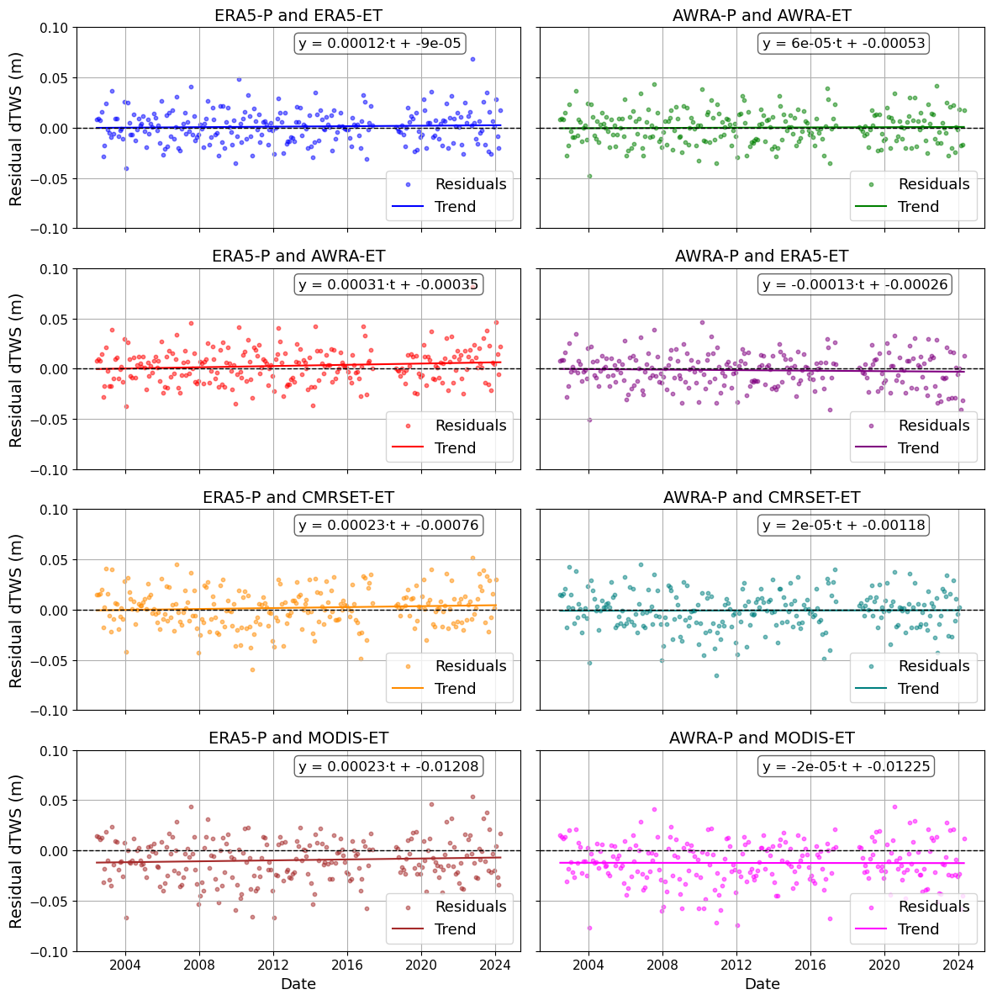

In [38]:
colors = ['blue', 'green', 'red', 'purple', 'darkorange', 'teal', 'brown', 'magenta']

series_list_names = ['ERA5-P and ERA5-ET', 'AWRA-P and AWRA-ET',
                     'ERA5-P and AWRA-ET', 'AWRA-P and ERA5-ET',
                     'ERA5-P and CMRSET-ET', 'AWRA-P and CMRSET-ET',
                     'ERA5-P and MODIS-ET', 'AWRA-P and MODIS-ET']

dates = pd.to_datetime(dates.values)  # Ensure dates are pandas datetime

n = len(nw_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12, rows * 3), sharex=True, sharey=True)
axs = axs.flatten()

for i in range(n):
    series = nw_series_list[i]
    name = series_list_names[i]
    trimmed = processed_data_nw["GRACE_dTWS"][:len(series)]
    date_slice = dates[:len(series)]

    mask = ~np.isnan(series) & ~np.isnan(trimmed)
    residuals = trimmed[mask] - series[mask]
    valid_dates = date_slice[mask]

    # Convert dates to numeric format for trend fitting
    x_numeric = valid_dates.map(pd.Timestamp.toordinal).values
    x_numeric = x_numeric - x_numeric[0]
    y = residuals

    # Fit linear trend
    slope, intercept = np.polyfit(x_numeric, y, 1)
    trend_line = slope * x_numeric + intercept

    axs[i].scatter(valid_dates, residuals, s=10, alpha=0.5, color=colors[i % len(colors)], label='Residuals')
    axs[i].plot(valid_dates, trend_line, color=colors[i % len(colors)], linewidth=1.5, label='Trend')
    axs[i].axhline(0, color='black', linestyle='--', linewidth=1)
    axs[i].set_title(f"{name}", fontsize = 14)
    axs[i].set_ylim([-0.1, 0.1])
    axs[i].legend(fontsize = 13 ,loc = 4)
    axs[i].tick_params(axis='both', which='both', labelsize = 11)

    # Annotate trend line equation
    slope_rounded = round(slope * 365, 5)  # Optional: convert to per year
    intercept_rounded = round(intercept, 5)
    equation = f"y = {slope_rounded}·t + {intercept_rounded}"
    axs[i].text(0.5, 0.9, equation,
                transform=axs[i].transAxes,
                fontsize=12,
                bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

axs[0].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[2].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[4].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[6].set_ylabel("Residual dTWS (m)", fontsize = 14)

axs[6].set_xlabel("Date", fontsize = 13)
axs[7].set_xlabel("Date", fontsize = 13)

for ax in axs:
    ax.grid(True)

#plt.suptitle("Residual Graphs for Northwest MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Same comments as above about MODIS
- Model combinations using ERA5-P appear to slightly increase error near the end of the time period, consistent with the precipitation graphs above

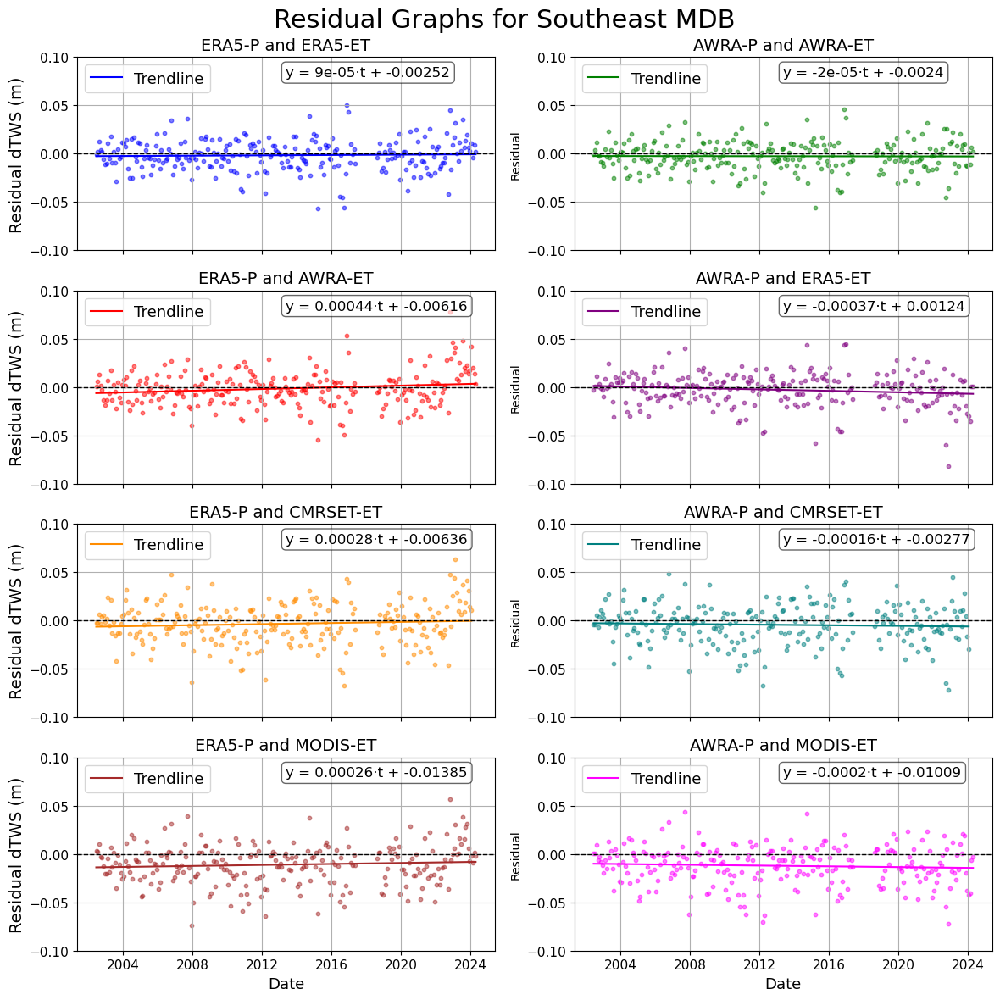

In [39]:
colors = ['blue', 'green', 'red', 'purple', 'darkorange', 'teal', 'brown', 'magenta']

series_list_names = ['ERA5-P and ERA5-ET', 'AWRA-P and AWRA-ET',
                     'ERA5-P and AWRA-ET', 'AWRA-P and ERA5-ET',
                     'ERA5-P and CMRSET-ET', 'AWRA-P and CMRSET-ET',
                     'ERA5-P and MODIS-ET', 'AWRA-P and MODIS-ET']

dates = pd.to_datetime(dates.values)  # Ensure dates are pandas datetime

n = len(se_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12, rows * 3), sharex=True)
axs = axs.flatten()

for i in range(n):
    series = se_series_list[i]
    name = series_list_names[i]
    trimmed = processed_data_se["GRACE_dTWS"][:len(series)]
    date_slice = dates[:len(series)]

    mask = ~np.isnan(series) & ~np.isnan(trimmed)
    residuals = trimmed[mask] - series[mask]
    valid_dates = date_slice[mask]

    # Convert dates to numeric format for trend fitting
    x_numeric = valid_dates.map(pd.Timestamp.toordinal).values
    x_numeric = x_numeric - x_numeric[0]
    y = residuals

    # Fit linear trend
    slope, intercept = np.polyfit(x_numeric, y, 1)
    trend_line = slope * x_numeric + intercept

    axs[i].scatter(valid_dates, residuals, s=10, alpha=0.5, color=colors[i % len(colors)])
    axs[i].plot(valid_dates, trend_line, color=colors[i % len(colors)], linewidth=1.5, label='Trendline')
    axs[i].axhline(0, color='black', linestyle='--', linewidth=1)
    axs[i].set_title(f"{name}", fontsize = 14)
    axs[i].set_ylabel("Residual")
    axs[i].set_ylim([-0.1, 0.1])
    axs[i].legend(fontsize = 13 ,loc = 2)
    axs[i].tick_params(axis='both', which='both', labelsize = 11)

    # Annotate trend line equation
    slope_rounded = round(slope * 365, 5)  # Optional: convert to per year
    intercept_rounded = round(intercept, 5)
    equation = f"y = {slope_rounded}·t + {intercept_rounded}"
    axs[i].text(0.5, 0.9, equation,
                transform=axs[i].transAxes,
                fontsize=12,
                bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

axs[0].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[2].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[4].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[6].set_ylabel("Residual dTWS (m)", fontsize = 14)

axs[6].set_xlabel("Date", fontsize = 13)
axs[7].set_xlabel("Date", fontsize = 13)

for ax in axs:
    ax.grid(True)

plt.suptitle("Residual Graphs for Southeast MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Same comments as above about MODIS
- Same comment about ERA5-P causing slight increase in error over time
- On the other hand, the residuals in graphs using AWRA-P appear to be slightly decreasing over time

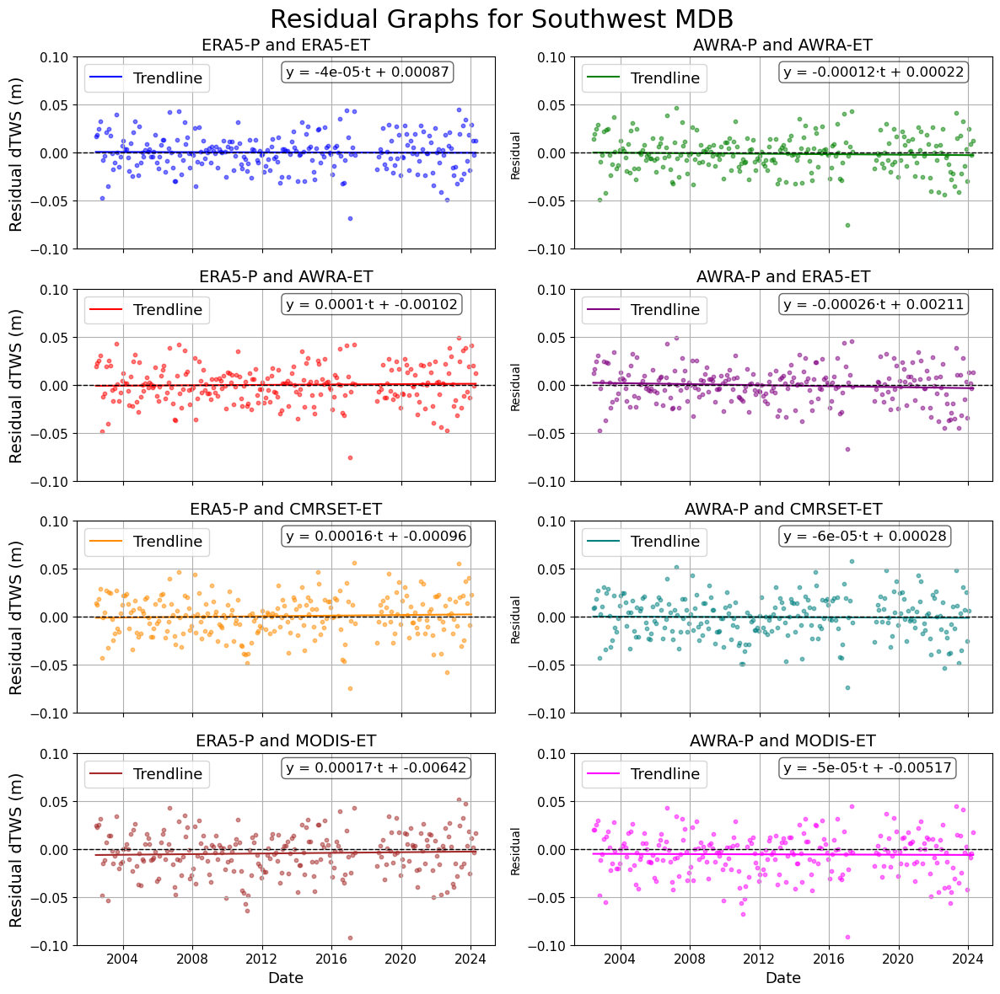

In [40]:
colors = ['blue', 'green', 'red', 'purple', 'darkorange', 'teal', 'brown', 'magenta']

series_list_names = ['ERA5-P and ERA5-ET', 'AWRA-P and AWRA-ET',
                     'ERA5-P and AWRA-ET', 'AWRA-P and ERA5-ET',
                     'ERA5-P and CMRSET-ET', 'AWRA-P and CMRSET-ET',
                     'ERA5-P and MODIS-ET', 'AWRA-P and MODIS-ET']

dates = pd.to_datetime(dates.values)  # Ensure dates are pandas datetime

n = len(sw_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12, rows * 3), sharex=True)
axs = axs.flatten()

for i in range(n):
    series = sw_series_list[i]
    name = series_list_names[i]
    trimmed = processed_data_sw["GRACE_dTWS"][:len(series)]
    date_slice = dates[:len(series)]

    mask = ~np.isnan(series) & ~np.isnan(trimmed)
    residuals = trimmed[mask] - series[mask]
    valid_dates = date_slice[mask]

    # Convert dates to numeric format for trend fitting
    x_numeric = valid_dates.map(pd.Timestamp.toordinal).values
    x_numeric = x_numeric - x_numeric[0]
    y = residuals

    # Fit linear trend
    slope, intercept = np.polyfit(x_numeric, y, 1)
    trend_line = slope * x_numeric + intercept

    axs[i].scatter(valid_dates, residuals, s=10, alpha=0.5, color=colors[i % len(colors)])
    axs[i].plot(valid_dates, trend_line, color=colors[i % len(colors)], linewidth=1.5, label='Trendline')
    axs[i].axhline(0, color='black', linestyle='--', linewidth=1)
    axs[i].set_title(f"{name}", fontsize = 14)
    axs[i].set_ylabel("Residual")
    axs[i].set_ylim([-0.1, 0.1])
    axs[i].legend(fontsize = 13 ,loc = 2)
    axs[i].tick_params(axis='both', which='both', labelsize = 11)

    # Annotate trend line equation
    slope_rounded = round(slope * 365, 5)  # Optional: convert to per year
    intercept_rounded = round(intercept, 5)
    equation = f"y = {slope_rounded}·t + {intercept_rounded}"
    axs[i].text(0.5, 0.9, equation,
                transform=axs[i].transAxes,
                fontsize=12,
                bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

axs[0].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[2].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[4].set_ylabel("Residual dTWS (m)", fontsize = 14)
axs[6].set_ylabel("Residual dTWS (m)", fontsize = 14)

axs[6].set_xlabel("Date", fontsize = 13)
axs[7].set_xlabel("Date", fontsize = 13)

for ax in axs:
    ax.grid(True)

plt.suptitle("Residual Graphs for Southwest MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Slope of residuals very consistently close to zero in all of these graphs
- Not as extreme of an overestimation of MODIS-ET in these graphs, potentially cancelled out by positive runoff entering this sub-basin

### *RMSE and unbiased RMSE*

Bias for ERA5-P and ERA5-ET
0.00097
Bias for AWRA-P and AWRA-ET
0.00234
Bias for ERA5-P and AWRA-ET
-0.00072
Bias for AWRA-P and ERA5-ET
0.00403
Bias for ERA5-P and CMRSET-ET
0.00062
Bias for AWRA-P and CMRSET-ET
0.0035
Bias for ERA5-P and MODIS-ET
0.0147
Bias for AWRA-P and MODIS-ET
0.01775


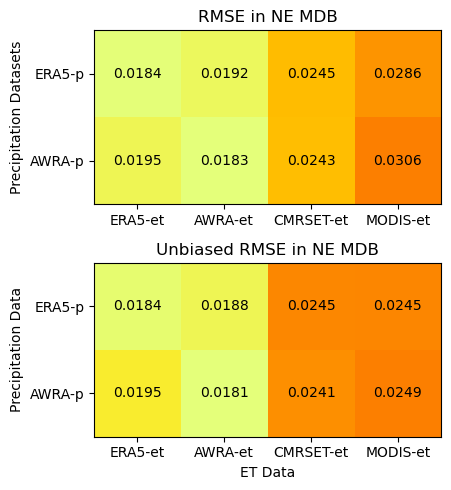

In [41]:
# Northeast

# RMSE

rmse_values_ne = []

for i in range(len(ne_series_list)):

    series = ne_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_ne["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    rmse = np.round(np.sqrt(mean_squared_error(trimmed_GRACE[mask], series[mask])),5)
    rmse_values_ne.append(rmse)
    #print(f"RMSE for {name}")
    #print(rmse)


# BIAS


for i in range(len(ne_series_list)):

    series = ne_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_ne["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    bias = np.round((np.nanmean(series[mask]) - np.nanmean(trimmed_GRACE[mask])),5)
    print(f"Bias for {name}")
    print(bias)

# UNBIASED RMSE


ubrmse_values_ne = []

for i in range(len(ne_series_list)):

    series = ne_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_ne["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    ubRMSE = np.sqrt(np.nanmean(
            (   (series[mask]-np.nanmean(series[mask])) - 
                (trimmed_GRACE[mask]-np.nanmean(trimmed_GRACE[mask]))
                )   **2    )   )
    ubrmse_values_ne.append(ubRMSE)

    #print(f"Unbiased RMSE for {name}")
    #print(np.round(ubRMSE,5))

# Plot heatmaps

rmse_values = np.array([
    [rmse_values_ne[0], rmse_values_ne[3], rmse_values_ne[4], rmse_values_ne[6]],  # ERA5-p
    [rmse_values_ne[2], rmse_values_ne[1], rmse_values_ne[5], rmse_values_ne[7]]   # AWRA-p
])

ubrmse_values = np.array([
    [ubrmse_values_ne[0], ubrmse_values_ne[3], ubrmse_values_ne[4], ubrmse_values_ne[6]],  # ERA5-p
    [ubrmse_values_ne[2], ubrmse_values_ne[1], ubrmse_values_ne[5], ubrmse_values_ne[7]]   # AWRA-p
])

# Labels
a_labels = ['ERA5-et', 'AWRA-et', 'CMRSET-et', 'MODIS-et']
b_labels = ['ERA5-p', 'AWRA-p']

# Create figure and subplots
fig, axes = plt.subplots(nrows=2, figsize=(12, 5))

# --- First subplot: RMSE ---
cax1 = axes[0].imshow(rmse_values, cmap='Wistia')
for i in range(rmse_values.shape[0]):
    for j in range(rmse_values.shape[1]):
        axes[0].text(j, i, f"{rmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[0].set_title("RMSE in NE MDB")
axes[0].set_ylabel("Precipitation Datasets")
axes[0].set_yticks(np.arange(len(b_labels)))
axes[0].set_yticklabels(b_labels)

axes[0].set_xticks(np.arange(len(a_labels)))
axes[0].set_xticklabels(a_labels)
#fig.colorbar(cax1, ax=axes[0], label='RMSE')



# # --- First subplot: RMSE ---
# cax1 = axes[1].imshow(rmse_values, cmap='Wistia')
# for i in range(rmse_values.shape[0]):
#     for j in range(rmse_values.shape[1]):
#         axes[1].text(j, i, f"{rmse_values[i, j]:.3f}", ha="center", va="center", color="black")

# axes[1].set_title("RMSE")
# axes[1].set_ylabel("Precipitation Datasets")
# axes[1].set_yticks(np.arange(len(b_labels)))
# axes[1].set_yticklabels(b_labels)
# #fig.colorbar(cax1, ax=axes[0], label='RMSE')




# --- Second subplot: ubRMSE ---
cax2 = axes[1].imshow(ubrmse_values, cmap='Wistia')
for i in range(ubrmse_values.shape[0]):
    for j in range(ubrmse_values.shape[1]):
        axes[1].text(j, i, f"{ubrmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[1].set_title("Unbiased RMSE in NE MDB")
axes[1].set_xlabel("ET Data")
axes[1].set_ylabel("Precipitation Data")
axes[1].set_xticks(np.arange(len(a_labels)))
axes[1].set_yticks(np.arange(len(b_labels)))
axes[1].set_xticklabels(a_labels)
axes[1].set_yticklabels(b_labels)
#fig.colorbar(cax2, ax=axes[1], label='ubRMSE')

# Layout
plt.tight_layout()
plt.show()

Comments on error metrics for NE basin:
- Only model combinations with MODIS-ET appear to have signficiant bias (>0.01 m), as expected
- The best performing model combination in terms of unbiased RMSE is AWRA-P and AWRA-ET
- Looking only at model combinations which use AWRA-P (assumed to be more accurate than ERA5-P), AWRA-ET performs best, followed by ERA5-ET, then CMRSET-ET, then MODIS-ET
- Interesting that a globally calibrated model (ERA5) outperforms CMRSET (locally calibrated)

Bias for ERA5-P and ERA5-ET
-0.00118
Bias for AWRA-P and AWRA-ET
-0.00012
Bias for ERA5-P and AWRA-ET
-0.00293
Bias for AWRA-P and ERA5-ET
0.00163
Bias for ERA5-P and CMRSET-ET
-0.00171
Bias for AWRA-P and CMRSET-ET
0.00093
Bias for ERA5-P and MODIS-ET
0.00961
Bias for AWRA-P and MODIS-ET
0.01242


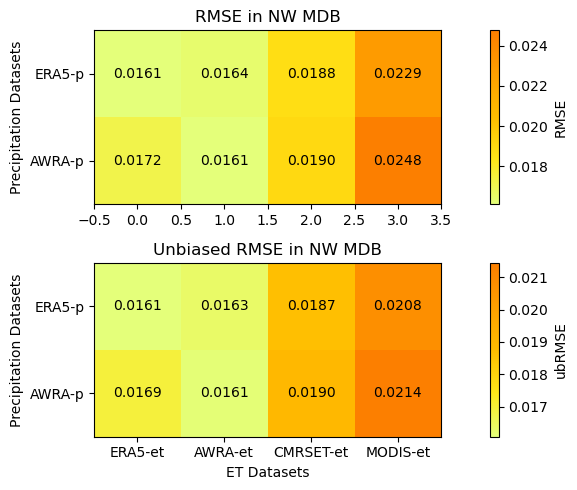

In [42]:
# Northwest

# RMSE

rmse_values_nw = []

for i in range(len(nw_series_list)):

    series = nw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_nw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    rmse = np.round(np.sqrt(mean_squared_error(trimmed_GRACE[mask], series[mask])),5)
    rmse_values_nw.append(rmse)
    #print(f"RMSE for {name}")
    #print(rmse)


# BIAS


for i in range(len(nw_series_list)):

    series = nw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_nw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    bias = np.round((np.nanmean(series[mask]) - np.nanmean(trimmed_GRACE[mask])),5)
    print(f"Bias for {name}")
    print(bias)

# UNBIASED RMSE


ubrmse_values_nw = []

for i in range(len(nw_series_list)):

    series = nw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_nw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    ubRMSE = np.sqrt(np.nanmean(
            (   (series[mask]-np.nanmean(series[mask])) - 
                (trimmed_GRACE[mask]-np.nanmean(trimmed_GRACE[mask]))
                )   **2    )   )
    ubrmse_values_nw.append(ubRMSE)

    #print(f"Unbiased RMSE for {name}")
    #print(np.round(ubRMSE,5))

# Plot heatmaps

rmse_values = np.array([
    [rmse_values_nw[0], rmse_values_nw[3], rmse_values_nw[4], rmse_values_nw[6]],  # ERA5-p
    [rmse_values_nw[2], rmse_values_nw[1], rmse_values_nw[5], rmse_values_nw[7]]   # AWRA-p
])

ubrmse_values = np.array([
    [ubrmse_values_nw[0], ubrmse_values_nw[3], ubrmse_values_nw[4], ubrmse_values_nw[6]],  # ERA5-p
    [ubrmse_values_nw[2], ubrmse_values_nw[1], ubrmse_values_nw[5], ubrmse_values_nw[7]]   # AWRA-p
])

# Labels
a_labels = ['ERA5-et', 'AWRA-et', 'CMRSET-et', 'MODIS-et']
b_labels = ['ERA5-p', 'AWRA-p']

# Create figure and subplots
fig, axes = plt.subplots(nrows=2, figsize=(10, 5))

# --- First subplot: RMSE ---
cax1 = axes[0].imshow(rmse_values, cmap='Wistia')
for i in range(rmse_values.shape[0]):
    for j in range(rmse_values.shape[1]):
        axes[0].text(j, i, f"{rmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[0].set_title("RMSE in NW MDB")
axes[0].set_ylabel("Precipitation Datasets")
axes[0].set_yticks(np.arange(len(b_labels)))
axes[0].set_yticklabels(b_labels)
fig.colorbar(cax1, ax=axes[0], label='RMSE')

# --- Second subplot: ubRMSE ---
cax2 = axes[1].imshow(ubrmse_values, cmap='Wistia')
for i in range(ubrmse_values.shape[0]):
    for j in range(ubrmse_values.shape[1]):
        axes[1].text(j, i, f"{ubrmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[1].set_title("Unbiased RMSE in NW MDB")
axes[1].set_xlabel("ET Datasets")
axes[1].set_ylabel("Precipitation Datasets")
axes[1].set_xticks(np.arange(len(a_labels)))
axes[1].set_yticks(np.arange(len(b_labels)))
axes[1].set_xticklabels(a_labels)
axes[1].set_yticklabels(b_labels)
fig.colorbar(cax2, ax=axes[1], label='ubRMSE')

# Layout
plt.tight_layout()
plt.show()

Comments on error metrics for NW basin:
- Only model combinations with MODIS-ET appear to have signficiant bias (~0.01 m), although the bias is slightly lower than in the NE basins
- The best performing model combinations in terms of unbiased RMSE are AWRA-P/AWRA-ET and ERA5-P/ERA5-ET
- Same result as above with ERA5-ET outperforming CMRSET, MODIS doing very poorly

Bias for ERA5-P and ERA5-ET
0.00159
Bias for AWRA-P and AWRA-ET
0.0026
Bias for ERA5-P and AWRA-ET
0.00145
Bias for AWRA-P and ERA5-ET
0.00274
Bias for ERA5-P and CMRSET-ET
0.00341
Bias for AWRA-P and CMRSET-ET
0.00441
Bias for ERA5-P and MODIS-ET
0.01107
Bias for AWRA-P and MODIS-ET
0.01222


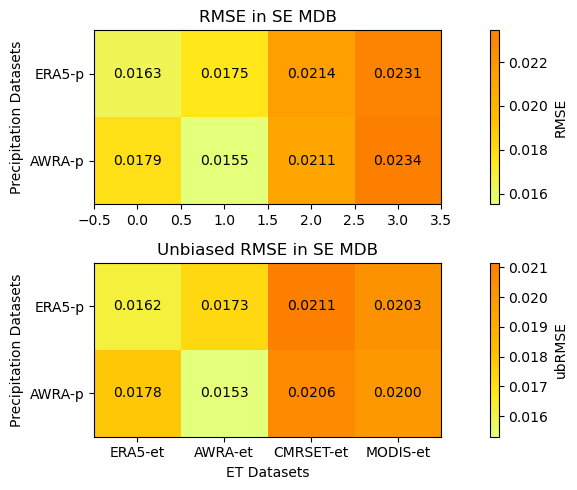

In [43]:
# Southeast

# RMSE

rmse_values_se = []

for i in range(len(se_series_list)):

    series = se_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_se["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    rmse = np.round(np.sqrt(mean_squared_error(trimmed_GRACE[mask], series[mask])),5)
    rmse_values_se.append(rmse)
    #print(f"RMSE for {name}")
    #print(rmse)


# BIAS


for i in range(len(ne_series_list)):

    series = se_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_se["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    bias = np.round((np.nanmean(series[mask]) - np.nanmean(trimmed_GRACE[mask])),5)
    print(f"Bias for {name}")
    print(bias)

# UNBIASED RMSE


ubrmse_values_se = []

for i in range(len(se_series_list)):

    series = se_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_se["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    ubRMSE = np.sqrt(np.nanmean(
            (   (series[mask]-np.nanmean(series[mask])) - 
                (trimmed_GRACE[mask]-np.nanmean(trimmed_GRACE[mask]))
                )   **2    )   )
    ubrmse_values_se.append(ubRMSE)

    #print(f"Unbiased RMSE for {name}")
    #print(np.round(ubRMSE,5))

# Plot heatmaps

rmse_values = np.array([
    [rmse_values_se[0], rmse_values_se[3], rmse_values_se[4], rmse_values_se[6]],  # ERA5-p
    [rmse_values_se[2], rmse_values_se[1], rmse_values_se[5], rmse_values_se[7]]   # AWRA-p
])

ubrmse_values = np.array([
    [ubrmse_values_se[0], ubrmse_values_se[3], ubrmse_values_se[4], ubrmse_values_se[6]],  # ERA5-p
    [ubrmse_values_se[2], ubrmse_values_se[1], ubrmse_values_se[5], ubrmse_values_se[7]]   # AWRA-p
])

# Labels
a_labels = ['ERA5-et', 'AWRA-et', 'CMRSET-et', 'MODIS-et']
b_labels = ['ERA5-p', 'AWRA-p']

# Create figure and subplots
fig, axes = plt.subplots(nrows=2, figsize=(10, 5))

# --- First subplot: RMSE ---
cax1 = axes[0].imshow(rmse_values, cmap='Wistia')
for i in range(rmse_values.shape[0]):
    for j in range(rmse_values.shape[1]):
        axes[0].text(j, i, f"{rmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[0].set_title("RMSE in SE MDB")
axes[0].set_ylabel("Precipitation Datasets")
axes[0].set_yticks(np.arange(len(b_labels)))
axes[0].set_yticklabels(b_labels)
fig.colorbar(cax1, ax=axes[0], label='RMSE')

# --- Second subplot: ubRMSE ---
cax2 = axes[1].imshow(ubrmse_values, cmap='Wistia')
for i in range(ubrmse_values.shape[0]):
    for j in range(ubrmse_values.shape[1]):
        axes[1].text(j, i, f"{ubrmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[1].set_title("Unbiased RMSE in SE MDB")
axes[1].set_xlabel("ET Datasets")
axes[1].set_ylabel("Precipitation Datasets")
axes[1].set_xticks(np.arange(len(a_labels)))
axes[1].set_yticks(np.arange(len(b_labels)))
axes[1].set_xticklabels(a_labels)
axes[1].set_yticklabels(b_labels)
fig.colorbar(cax2, ax=axes[1], label='ubRMSE')

# Layout
plt.tight_layout()
plt.show()

Comments on error metrics for SE basin:
- Lowest error metrics of all the sub-basins, except for ERA5-ET which performed worse in this basin compared to NW basin
- In this sub-basin, MODIS-ET slightly outperforms CMRSET-ET when bias is taken into account (unRMSE)
- Globally calibrated model (MODIS) outperforms locally calibrated one (CMRSET)
- It is possible that this is the case because the southeast basin is relatively wet and mountainous, and thus more closely resembles geography across other parts of the world compared to the other 3 sub-basins, which are more reflective of the geograhy across Australia

Bias for ERA5-P and ERA5-ET
-0.00046
Bias for AWRA-P and AWRA-ET
0.00109
Bias for ERA5-P and AWRA-ET
-1e-05
Bias for AWRA-P and ERA5-ET
0.00063
Bias for ERA5-P and CMRSET-ET
-0.00072
Bias for AWRA-P and CMRSET-ET
0.00034
Bias for ERA5-P and MODIS-ET
0.00465
Bias for AWRA-P and MODIS-ET
0.00574


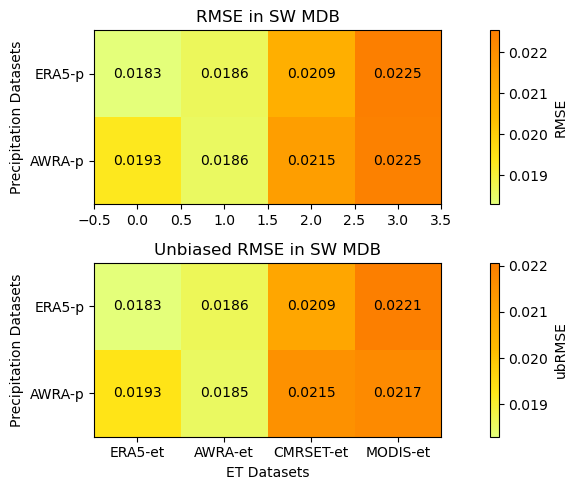

In [44]:
# Southwest

# RMSE

rmse_values_sw = []

for i in range(len(sw_series_list)):

    series = sw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_sw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    rmse = np.round(np.sqrt(mean_squared_error(trimmed_GRACE[mask], series[mask])),5)
    rmse_values_sw.append(rmse)
    #print(f"RMSE for {name}")
    #print(rmse)


# BIAS


for i in range(len(sw_series_list)):

    series = sw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_sw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    bias = np.round((np.nanmean(series[mask]) - np.nanmean(trimmed_GRACE[mask])),5)
    print(f"Bias for {name}")
    print(bias)

# UNBIASED RMSE


ubrmse_values_sw = []

for i in range(len(sw_series_list)):

    series = sw_series_list[i]
    name = series_list_names[i]

    trimmed_GRACE = processed_data_sw["GRACE_dTWS"][:len(series)]
    mask = ~np.isnan(series)

    ubRMSE = np.sqrt(np.nanmean(
            (   (series[mask]-np.nanmean(series[mask])) - 
                (trimmed_GRACE[mask]-np.nanmean(trimmed_GRACE[mask]))
                )   **2    )   )
    ubrmse_values_sw.append(ubRMSE)

    #print(f"Unbiased RMSE for {name}")
    #print(np.round(ubRMSE,5))

# Plot heatmaps

rmse_values = np.array([
    [rmse_values_sw[0], rmse_values_sw[3], rmse_values_sw[4], rmse_values_sw[6]],  # ERA5-p
    [rmse_values_sw[2], rmse_values_sw[1], rmse_values_sw[5], rmse_values_sw[7]]   # AWRA-p
])

ubrmse_values = np.array([
    [ubrmse_values_sw[0], ubrmse_values_sw[3], ubrmse_values_sw[4], ubrmse_values_sw[6]],  # ERA5-p
    [ubrmse_values_sw[2], ubrmse_values_sw[1], ubrmse_values_sw[5], ubrmse_values_sw[7]]   # AWRA-p
])

# Labels
a_labels = ['ERA5-et', 'AWRA-et', 'CMRSET-et', 'MODIS-et']
b_labels = ['ERA5-p', 'AWRA-p']

# Create figure and subplots
fig, axes = plt.subplots(nrows=2, figsize=(10, 5))

# --- First subplot: RMSE ---
cax1 = axes[0].imshow(rmse_values, cmap='Wistia')
for i in range(rmse_values.shape[0]):
    for j in range(rmse_values.shape[1]):
        axes[0].text(j, i, f"{rmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[0].set_title("RMSE in SW MDB")
axes[0].set_ylabel("Precipitation Datasets")
axes[0].set_yticks(np.arange(len(b_labels)))
axes[0].set_yticklabels(b_labels)
fig.colorbar(cax1, ax=axes[0], label='RMSE')

# --- Second subplot: ubRMSE ---
cax2 = axes[1].imshow(ubrmse_values, cmap='Wistia')
for i in range(ubrmse_values.shape[0]):
    for j in range(ubrmse_values.shape[1]):
        axes[1].text(j, i, f"{ubrmse_values[i, j]:.4f}", ha="center", va="center", color="black")

axes[1].set_title("Unbiased RMSE in SW MDB")
axes[1].set_xlabel("ET Datasets")
axes[1].set_ylabel("Precipitation Datasets")
axes[1].set_xticks(np.arange(len(a_labels)))
axes[1].set_yticks(np.arange(len(b_labels)))
axes[1].set_xticklabels(a_labels)
axes[1].set_yticklabels(b_labels)
fig.colorbar(cax2, ax=axes[1], label='ubRMSE')

# Layout
plt.tight_layout()
plt.show()

Comments on error metrics for SW basin:
- ERA5-P/ERA5-ET actually outperforms AWRA-P/AWRA-ET here
- However, when just looking at model combinations with AWRA-P (assumed to be more accurate), ERA5-ET still does not perform as well as AWRA-ET
- This suggests that wholistically, ERA5 TWS performs well but ERA5-ET on its own is not quite as reliable
- MODIS-ET and CMRSET-ET perform similarly here - why?
- It's a very arid basin, but lots of runoff enters basin because of confluence of rivers
- Not very much runoff leaves basin because lots of water is extracted for agriculture, and possibly for Adelaide's water supply

### **Correlation**

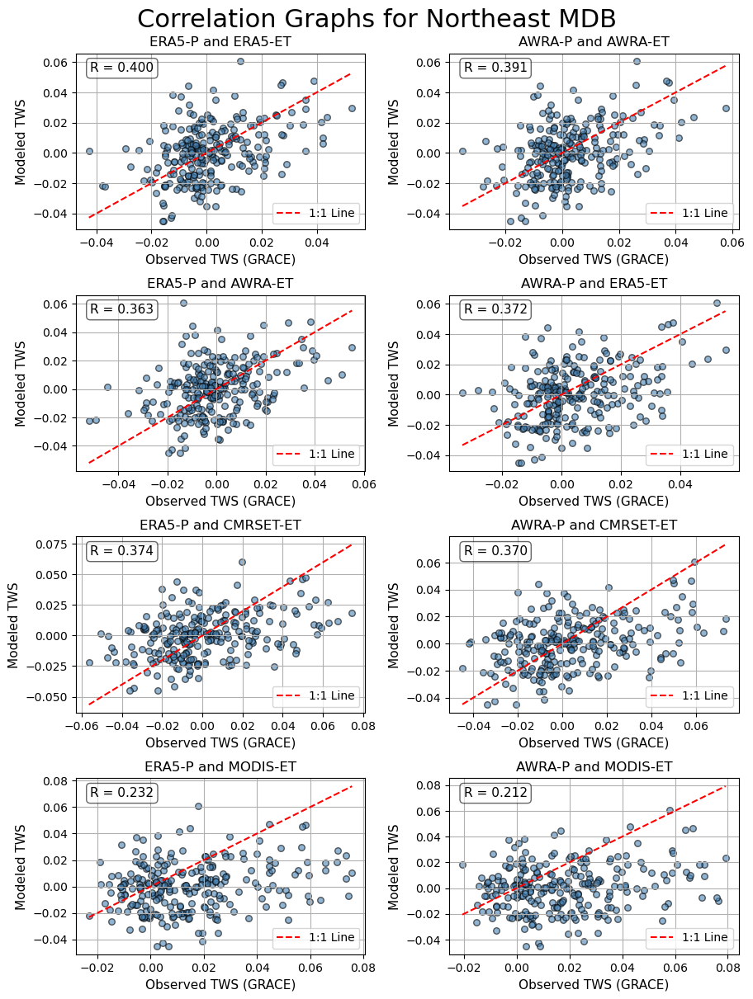

In [45]:
# Northeast PEARSON R (correlation coefficient)

n = len(ne_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12/1.3, rows * 4/1.3))
axs = axs.flatten()  # Flatten in case of 2D axes

for i in range(n):
    series = ne_series_list[i]
    name = series_list_names[i]

    # Trim to matching length
    trimmed_GRACE = processed_data_ne["GRACE_dTWS"][:len(series)]

    # Mask valid values
    mask = ~np.isnan(series) & ~np.isnan(trimmed_GRACE)
    observed = series[mask]
    modeled = trimmed_GRACE[mask]

    # Compute Pearson R
    corr_coef, p_value = pearsonr(observed, modeled)

    # Plot in subplot
    ax = axs[i]
    ax.scatter(observed, modeled, alpha=0.6, color='steelblue', edgecolor='k', s=30)
    ax.plot([observed.min(), observed.max()],
            [observed.min(), observed.max()], 'r--', label='1:1 Line')

    ax.set_title(f'{name}', fontsize=12)
    ax.set_xlabel('Observed TWS (GRACE)', fontsize=11)
    ax.set_ylabel('Modeled TWS', fontsize=11)
    ax.grid(True)

    # Annotate Pearson R
    ax.text(0.05, 0.95, f'R = {corr_coef:.3f}',
            transform=ax.transAxes,
            verticalalignment='top',
            fontsize=11,
            bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

    ax.legend(loc=4)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Correlation Graphs for Northeast MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Generally, corelation is low-medium at best
- Model combinations with MODIS-ET do very poorly
- Model combinations which use ERA5-P actually have slightly stronger correlations with GRACE data on average - this is a very surprising result
- The most correlated model combination is ERA5-P/ERA5-ET (R = 0.40), followed by AWRA-P/AWRA-ET (R = 0.39)
- Is it not very obvious whether locally calibrated LSMs actually outperform globally calibrated models in this instance

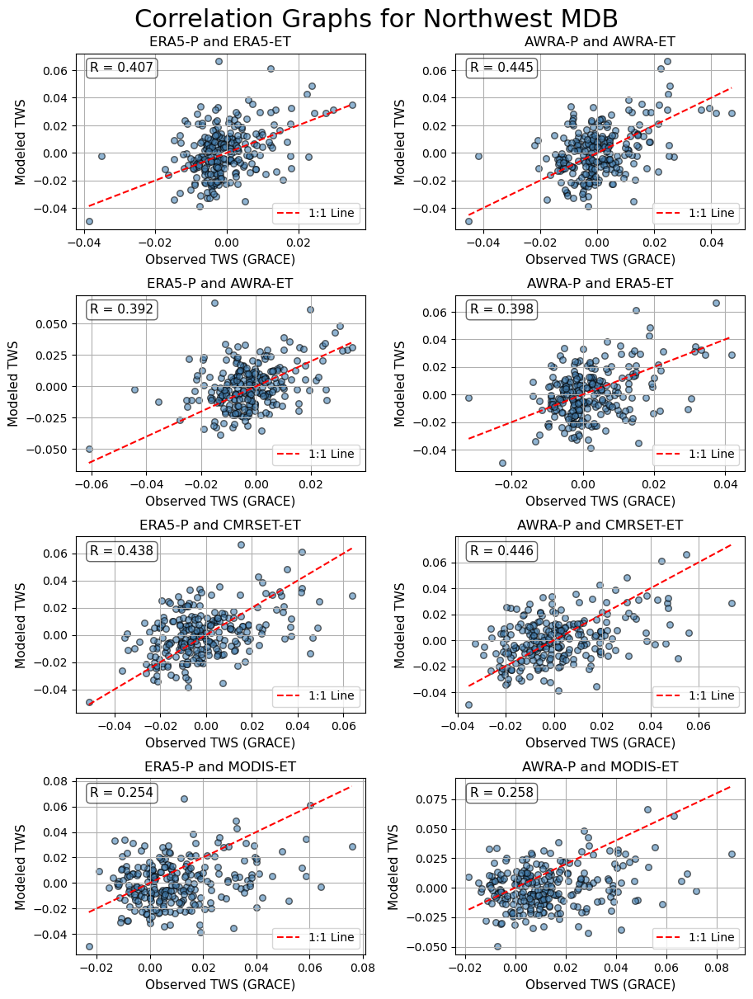

In [46]:
# NORTHWEST PEARSON R (correlation coefficient)

n = len(nw_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12/1.3, rows * 4/1.3))
axs = axs.flatten()  # Flatten in case of 2D axes

for i in range(n):
    series = nw_series_list[i]
    name = series_list_names[i]

    # Trim to matching length
    trimmed_GRACE = processed_data_nw["GRACE_dTWS"][:len(series)]

    # Mask valid values
    mask = ~np.isnan(series) & ~np.isnan(trimmed_GRACE)
    observed = series[mask]
    modeled = trimmed_GRACE[mask]

    # Compute Pearson R
    corr_coef, p_value = pearsonr(observed, modeled)

    # Plot in subplot
    ax = axs[i]
    ax.scatter(observed, modeled, alpha=0.6, color='steelblue', edgecolor='k', s=30)
    ax.plot([observed.min(), observed.max()],
            [observed.min(), observed.max()], 'r--', label='1:1 Line')

    ax.set_title(f'{name}', fontsize=12)
    ax.set_xlabel('Observed TWS (GRACE)', fontsize=11)
    ax.set_ylabel('Modeled TWS', fontsize=11)
    ax.grid(True)

    # Annotate Pearson R
    ax.text(0.05, 0.95, f'R = {corr_coef:.3f}',
            transform=ax.transAxes,
            verticalalignment='top',
            fontsize=11,
            bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

    ax.legend(loc=4)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Correlation Graphs for Northwest MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Again, correlation is quite low on average, though not quite as bad as in NE basin
- Model combinations using AWRA-P are marginally better than those with ERA5-P
- AWRA-P/AWRA-ET and AWRA-P/CMRSET-ET are the best, both with R values of approximately 0.45
- MODIS-ET again doing very poorly
- Global ET products (MODIS, ERA5) seems to cause lower correlations with GRACE data compared to local ones (CMRSET, AWRA) in this instance, as we excpect

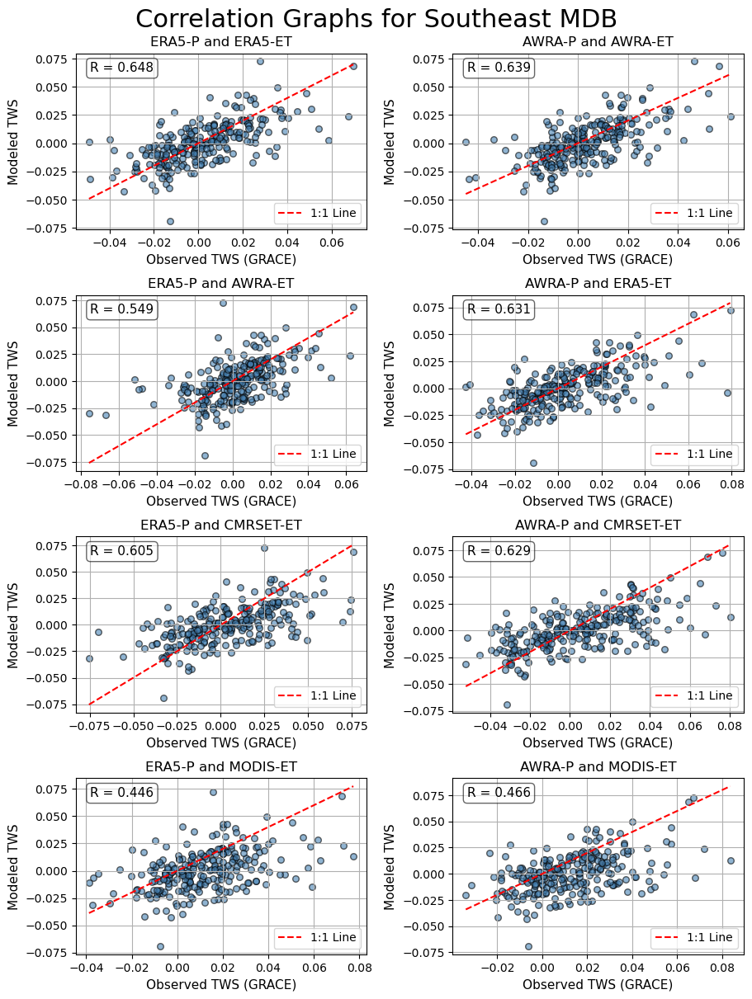

In [47]:
# Southeast PEARSON R (correlation coefficient)

n = len(se_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12/1.3, rows * 4/1.3))
axs = axs.flatten()  # Flatten in case of 2D axes

for i in range(n):
    series = se_series_list[i]
    name = series_list_names[i]

    # Trim to matching length
    trimmed_GRACE = processed_data_se["GRACE_dTWS"][:len(series)]

    # Mask valid values
    mask = ~np.isnan(series) & ~np.isnan(trimmed_GRACE)
    observed = series[mask]
    modeled = trimmed_GRACE[mask]

    # Compute Pearson R
    corr_coef, p_value = pearsonr(observed, modeled)

    # Plot in subplot
    ax = axs[i]
    ax.scatter(observed, modeled, alpha=0.6, color='steelblue', edgecolor='k', s=30)
    ax.plot([observed.min(), observed.max()],
            [observed.min(), observed.max()], 'r--', label='1:1 Line')

    ax.set_title(f'{name}', fontsize=12)
    ax.set_xlabel('Observed TWS (GRACE)', fontsize=11)
    ax.set_ylabel('Modeled TWS', fontsize=11)
    ax.grid(True)

    # Annotate Pearson R
    ax.text(0.05, 0.95, f'R = {corr_coef:.3f}',
            transform=ax.transAxes,
            verticalalignment='top',
            fontsize=11,
            bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

    ax.legend(loc=4)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Correlation Graphs for Southeast MDB", fontsize=22)
plt.tight_layout()
plt.show()

- These graphs have the highest correlation out of any of the basins
- All model combinations at least exhibit some degree of correlation with GRACE data (all R-values > 0.46)
- The best performing model combinations are still AWRA-P/AWRA-ET, ERA5-P/ERA5-ET, AWRA-P/ERA5-ET, and AWRA-P/CMRSET-ET (medium-high correlation, >0.6)
- Looking only at models using AWRA-P, the best ET models seem to be AWRA, followed closely by ERA5, then CMRSET (all very close)
- MODIS-ET does the worst, with R = 0.47 for both P's
- This sub-basins is outperforming the others as discussed above (higher elevations, more rainfall lead to more predicable behavior, reliable runoff data)

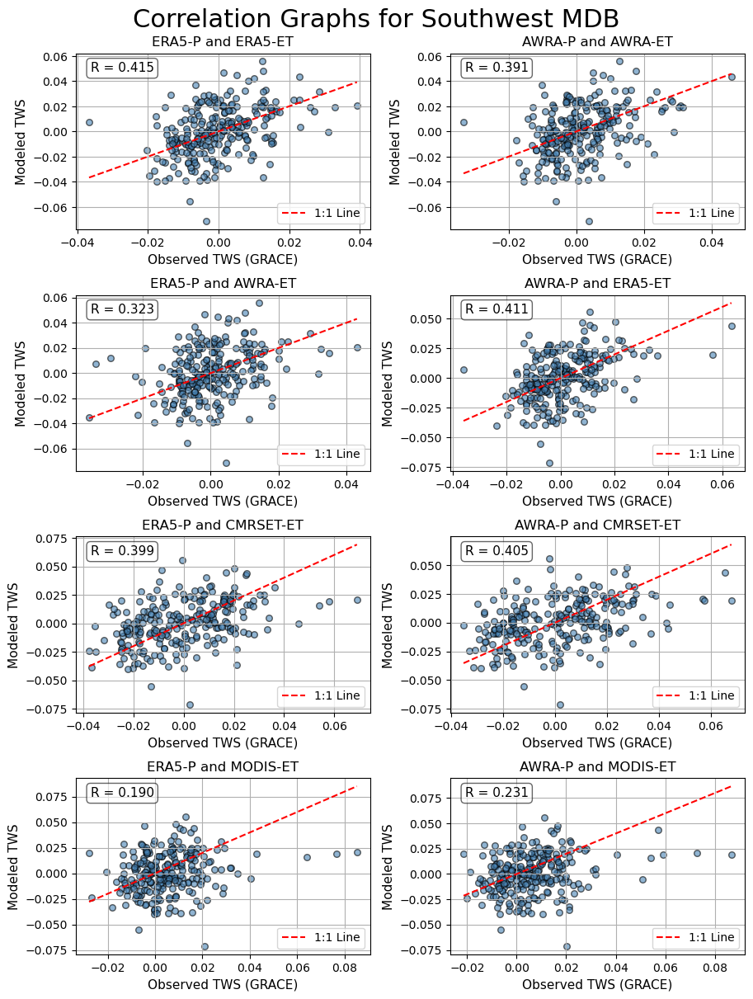

In [48]:
# Southwest PEARSON R (correlation coefficient)

n = len(sw_series_list)
cols = 2
rows = (n + 1) // cols

fig, axs = plt.subplots(rows, cols, figsize=(12/1.3, rows * 4/1.3))
axs = axs.flatten()  # Flatten in case of 2D axes

for i in range(n):
    series = sw_series_list[i]
    name = series_list_names[i]

    # Trim to matching length
    trimmed_GRACE = processed_data_sw["GRACE_dTWS"][:len(series)]

    # Mask valid values
    mask = ~np.isnan(series) & ~np.isnan(trimmed_GRACE)
    observed = series[mask]
    modeled = trimmed_GRACE[mask]

    # Compute Pearson R
    corr_coef, p_value = pearsonr(observed, modeled)

    # Plot in subplot
    ax = axs[i]
    ax.scatter(observed, modeled, alpha=0.6, color='steelblue', edgecolor='k', s=30)
    ax.plot([observed.min(), observed.max()],
            [observed.min(), observed.max()], 'r--', label='1:1 Line')

    ax.set_title(f'{name}', fontsize=12)
    ax.set_xlabel('Observed TWS (GRACE)', fontsize=11)
    ax.set_ylabel('Modeled TWS', fontsize=11)
    ax.grid(True)

    # Annotate Pearson R
    ax.text(0.05, 0.95, f'R = {corr_coef:.3f}',
            transform=ax.transAxes,
            verticalalignment='top',
            fontsize=11,
            bbox=dict(boxstyle="round", facecolor='white', alpha=0.6))

    ax.legend(loc=4)

# Hide any unused subplots
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.suptitle("Correlation Graphs for Southwest MDB", fontsize=22)
plt.tight_layout()
plt.show()

- Correlations are also generally quite poor in this sub-basin
- Even local model combinations (AWRA-P/AWRA-ET and AWRA-P/CMRSET-ET) aren't super correlated (R~0.4), though still more than others
- Runoff is most difficult to estimate in this sub-basin, because of confluence with ocean, water extraction for agriculture and Adelaide's water supply, and poor quality data
- Very arid basin, making precipitation events infrequent and highly variable (harder for models to tell different between signal and noise in calibration data) - same is true for NW basin
- Area is highly modified with infrastructure for urban water supply, thus affecting accuracy of LSMs

*Graphs to compare*

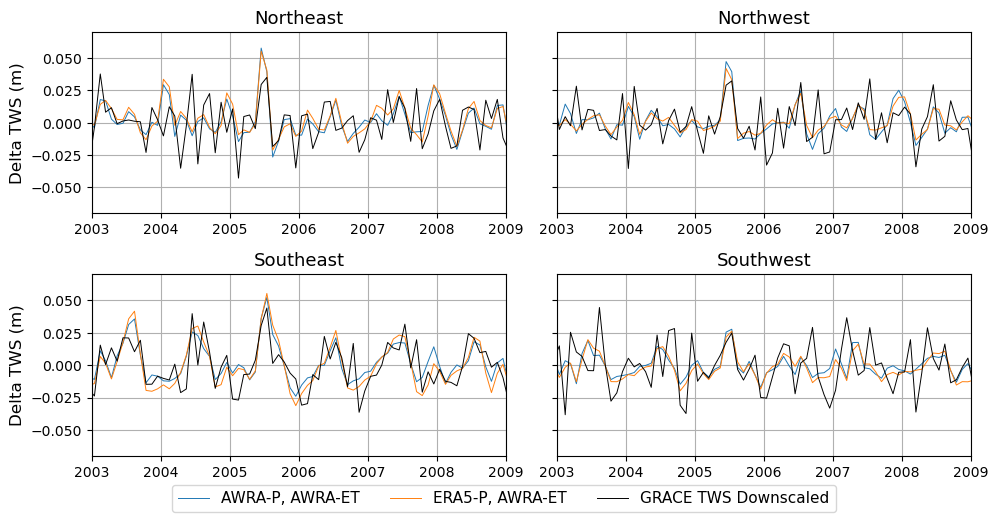

In [49]:
fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2003")
xlim2 = pd.to_datetime("2009")

ylim1 = -0.07
ylim2 = 0.07

# Northeast

# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[0].plot(dates, processed_data_ne["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[0].set_title('Northeast', fontsize=13)
axs[0].grid(True)
axs[0].set_xlim(xlim1, xlim2)
axs[0].set_ylim(ylim1, ylim2)
axs[0].set_ylabel('Delta TWS (m)', fontsize=12)

# Northwest

# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[1].plot(dates, processed_data_nw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[1].set_title('Northwest', fontsize=13)
axs[1].set_xlim(xlim1, xlim2)
axs[1].set_ylim(ylim1, ylim2)
axs[1].grid(True)


# Southeast

# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[2].plot(dates, processed_data_se["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[2].set_title('Southeast', fontsize=13)
axs[2].set_xlim(xlim1, xlim2)
axs[2].set_ylim(ylim1, ylim2)
axs[2].grid(True)
axs[2].set_ylabel('Delta TWS (m)', fontsize=12)


# Southwest

# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[3].plot(dates, processed_data_sw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[3].set_title('Southwest', fontsize=13)
axs[3].set_xlim(xlim1, xlim2)
axs[3].set_ylim(ylim1, ylim2)
axs[3].grid(True)

# Collect handles and labels from all subplots
handles = []
labels = []
for ax in axs:
    h, l = ax.get_legend_handles_labels()
    handles.extend(h)
    labels.extend(l)

# Remove duplicates (optional)
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))

# Create one legend below all subplots
fig.legend(by_label.values(), by_label.keys(), 
           loc='lower center', 
           bbox_to_anchor=(0.5, -0.05),  # Adjust vertical position below figure
           ncol=3,  # Number of columns in the legend
           fontsize=11)

# Adjust layout to make room for legend
plt.subplots_adjust(bottom=0.2)  # Increase bottom margin

plt.tight_layout()

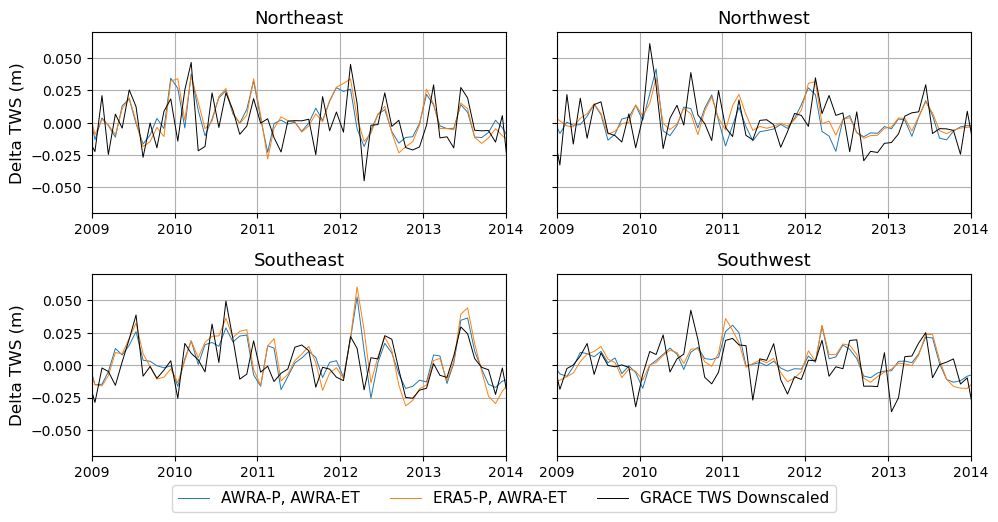

In [50]:
fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2009")
xlim2 = pd.to_datetime("2014")

ylim1 = -0.07
ylim2 = 0.07

# Northeast

# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[0].plot(dates, processed_data_ne["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[0].set_title('Northeast', fontsize=13)
axs[0].grid(True)
axs[0].set_xlim(xlim1, xlim2)
axs[0].set_ylim(ylim1, ylim2)
axs[0].set_ylabel('Delta TWS (m)', fontsize=12)

# Northwest

# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[1].plot(dates, processed_data_nw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[1].set_title('Northwest', fontsize=13)
axs[1].set_xlim(xlim1, xlim2)
axs[1].set_ylim(ylim1, ylim2)
axs[1].grid(True)


# Southeast

# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[2].plot(dates, processed_data_se["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[2].set_title('Southeast', fontsize=13)
axs[2].set_xlim(xlim1, xlim2)
axs[2].set_ylim(ylim1, ylim2)
axs[2].grid(True)
axs[2].set_ylabel('Delta TWS (m)', fontsize=12)


# Southwest

# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[3].plot(dates, processed_data_sw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS Downscaled', color='black')
axs[3].set_title('Southwest', fontsize=13)
axs[3].set_xlim(xlim1, xlim2)
axs[3].set_ylim(ylim1, ylim2)
axs[3].grid(True)

# Collect handles and labels from all subplots
handles = []
labels = []
for ax in axs:
    h, l = ax.get_legend_handles_labels()
    handles.extend(h)
    labels.extend(l)

# Remove duplicates (optional)
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))

# Create one legend below all subplots
fig.legend(by_label.values(), by_label.keys(), 
           loc='lower center', 
           bbox_to_anchor=(0.5, -0.05),  # Adjust vertical position below figure
           ncol=3,  # Number of columns in the legend
           fontsize=11)

# Adjust layout to make room for legend
plt.subplots_adjust(bottom=0.2)  # Increase bottom margin

plt.tight_layout()

- GRACE seems to be much more extreme than both model estimates in northwest and southwest (both arid basins)
- Range/extreness of model estimates seem to match better with GRACE in eastern basins
- Southeast performs best by far (ERA5-P seems to be slightly more extreme than AWRA-P in this sub-basin in particular, whereas its hard to tell in the other graphs)

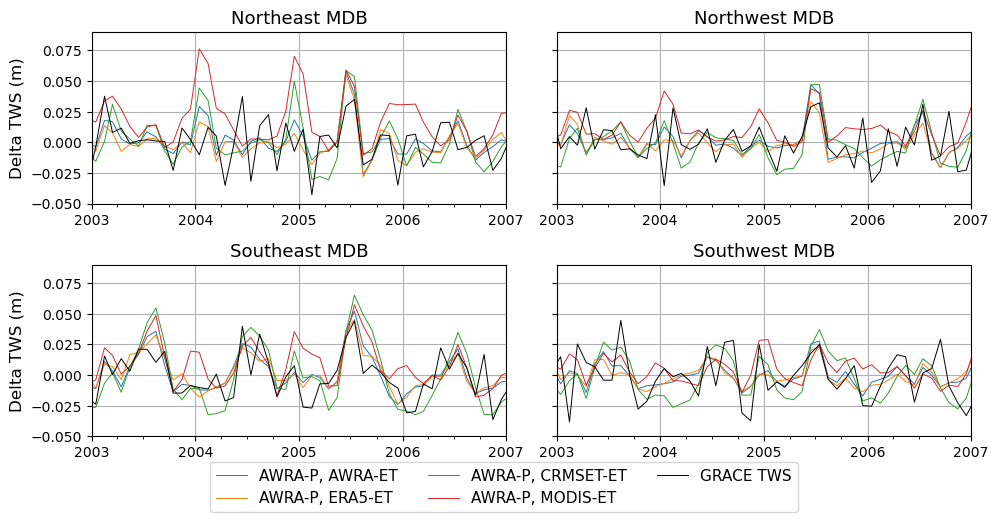

In [51]:
fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2003")
xlim2 = pd.to_datetime("2007")

ylim1 = -0.05
ylim2 = 0.09

# Northeast

# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[0].plot(dates, processed_data_ne["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[0].set_title('Northeast MDB', fontsize=13)
axs[0].grid(True)
axs[0].set_xlim(xlim1, xlim2)
axs[0].set_ylim(ylim1, ylim2)
axs[0].set_ylabel('Delta TWS (m)', fontsize=12)
#axs[0].legend()

# Northwest

# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[1].plot(dates, processed_data_nw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[1].set_title('Northwest MDB', fontsize=13)
axs[1].set_xlim(xlim1, xlim2)
axs[1].set_ylim(ylim1, ylim2)
axs[1].grid(True)
#axs[1].set_ylabel('Delta TWS (m)')


# Southeast

# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[2].plot(dates, processed_data_se["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[2].set_title('Southeast MDB', fontsize=13)
axs[2].set_xlim(xlim1, xlim2)
axs[2].set_ylim(ylim1, ylim2)
axs[2].grid(True)
axs[2].set_ylabel('Delta TWS (m)', fontsize=12)
#axs[2].set_xlabel('Time')


# Southwest

# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[3].plot(dates, processed_data_sw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[3].set_title('Southwest MDB', fontsize=13)
axs[3].set_xlim(xlim1, xlim2)
axs[3].set_ylim(ylim1, ylim2)
axs[3].grid(True)
#axs[3].set_ylabel('Delta TWS (m)')
axs[3].set_xlabel('  ')

for ax in axs:
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1,4,7,10)))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    #plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

# Collect handles and labels from all subplots
handles = []
labels = []
for ax in axs:
    h, l = ax.get_legend_handles_labels()
    handles.extend(h)
    labels.extend(l)

# Remove duplicates (optional)
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))

# Create one legend below all subplots
fig.legend(by_label.values(), by_label.keys(), 
           loc='lower center', 
           bbox_to_anchor=(0.5, -0.05),  # Adjust vertical position below figure
           ncol=3,  # Number of columns in the legend
           fontsize=11)

# Adjust layout to make room for legend
plt.subplots_adjust(bottom=0.2)  # Increase bottom margin

#plt.legend(loc=0, fontsize=10);
plt.tight_layout()

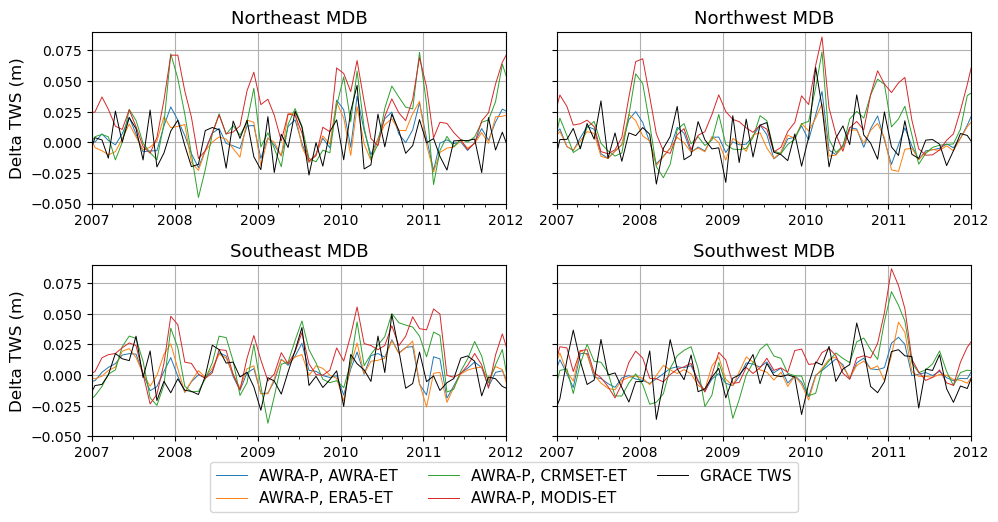

In [52]:
fig, axs = plt.subplots(2, 2, figsize=(10, 5), sharex=False, sharey=True)
axs = axs.flatten()

xlim1 = pd.to_datetime("2007")
xlim2 = pd.to_datetime("2012")

ylim1 = -0.05
ylim2 = 0.09

# Northeast

# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[0].plot(dates, processed_data_ne["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[0].plot(dates, processed_data_ne["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[0].plot(dates, processed_data_ne["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[0].set_title('Northeast MDB', fontsize=13)
axs[0].grid(True)
axs[0].set_xlim(xlim1, xlim2)
axs[0].set_ylim(ylim1, ylim2)
axs[0].set_ylabel('Delta TWS (m)', fontsize=12)
#axs[0].legend()

# Northwest

# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[1].plot(dates, processed_data_nw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[1].plot(dates, processed_data_nw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[1].plot(dates, processed_data_nw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[1].set_title('Northwest MDB', fontsize=13)
axs[1].set_xlim(xlim1, xlim2)
axs[1].set_ylim(ylim1, ylim2)
axs[1].grid(True)
#axs[1].set_ylabel('Delta TWS (m)')


# Southeast

# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[2].plot(dates, processed_data_se["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[2].plot(dates, processed_data_se["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[2].plot(dates, processed_data_se["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[2].set_title('Southeast MDB', fontsize=13)
axs[2].set_xlim(xlim1, xlim2)
axs[2].set_ylim(ylim1, ylim2)
axs[2].grid(True)
axs[2].set_ylabel('Delta TWS (m)', fontsize=12)
#axs[2].set_xlabel('Time')


# Southwest

# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_ERA5_et"], label = "ERA5-P, ERA5-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "AWRA-P, AWRA-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_AWRA_et"], label = "AWRA-P, ERA5-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_ERA5_et"], label = "ERA5-P, AWRA-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_CMRSET_et"], label = "ERA5-P, CRMSET-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_CMRSET_et"], label = "AWRA-P, CRMSET-ET", linewidth=0.7)
# axs[3].plot(dates, processed_data_sw["TWS_ERA5_p_MODIS_et"], label = "ERA5-P, MODIS-ET", linewidth=0.7)
axs[3].plot(dates, processed_data_sw["TWS_AWRA_p_MODIS_et"], label = "AWRA-P, MODIS-ET", linewidth=0.7)

axs[3].plot(dates, processed_data_sw["GRACE_dTWS"], linewidth=0.7, label='GRACE TWS', color='black')
axs[3].set_title('Southwest MDB', fontsize=13)
axs[3].set_xlim(xlim1, xlim2)
axs[3].set_ylim(ylim1, ylim2)
axs[3].grid(True)
#axs[3].set_ylabel('Delta TWS (m)')
axs[3].set_xlabel('  ')

for ax in axs:
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_minor_locator(mdates.MonthLocator(bymonth=(1,4,7,10)))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    #plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')

# Collect handles and labels from all subplots
handles = []
labels = []
for ax in axs:
    h, l = ax.get_legend_handles_labels()
    handles.extend(h)
    labels.extend(l)

# Remove duplicates (optional)
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))

# Create one legend below all subplots
fig.legend(by_label.values(), by_label.keys(), 
           loc='lower center', 
           bbox_to_anchor=(0.5, -0.05),  # Adjust vertical position below figure
           ncol=3,  # Number of columns in the legend
           fontsize=11)

# Adjust layout to make room for legend
plt.subplots_adjust(bottom=0.2)  # Increase bottom margin

#plt.legend(loc=0, fontsize=10);
plt.tight_layout()

##### ET Comparison
- Obvious that MODIS-ET is not doing well
- CMRSET seems more extreme than AWRA or ERA5, which is sometimes a good thing to emulate GRACE (capture floods wheras other models cannot)
- ERA5 and AWRA are very close to one another

## Trend analysis

Y = a1*x^2 + a2*x + b
[a1, a2, b]= [-7.92018984e-08  2.20445042e-05  1.42768397e-03]


Y = a1*x^2 + a2*x + b
[a1, a2, b]= [-2.06965184e-08  7.42768228e-06 -2.96878471e-04]


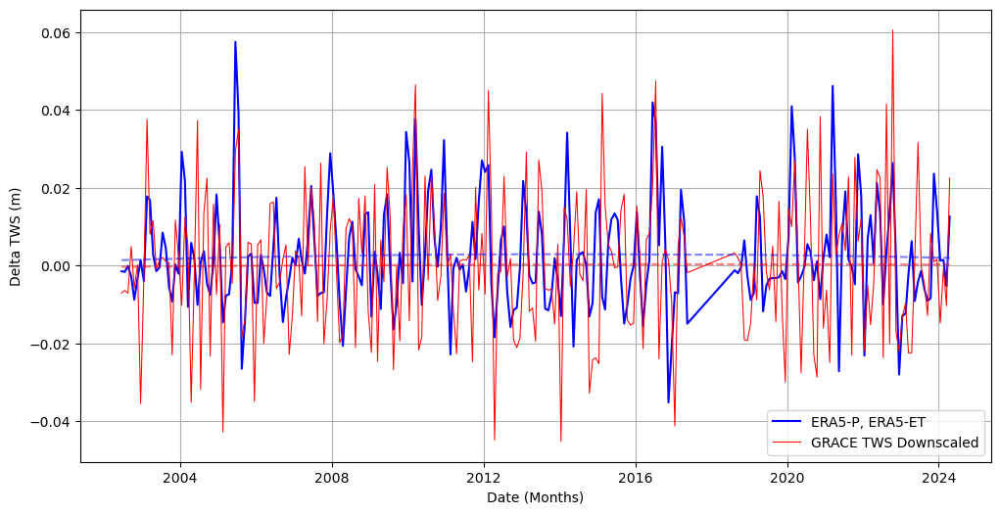

In [53]:
# NORTHEAST

# Second-order polynomial fitting for model
mask = ~np.isnan(processed_data_ne["TWS_AWRA_p_AWRA_et"])

T = np.arange(0, len(dates[mask]))

p = np.polyfit(T, processed_data_ne["TWS_AWRA_p_AWRA_et"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 
print("\n")

polyfit_ne_model = (T**2) * p[0] + T* p[1] + p[2]

# Second-order polynomial fitting for GRACE

T = np.arange(0, len(processed_data_ne["GRACE_dTWS"].time[mask]))

p = np.polyfit(T, processed_data_ne["GRACE_dTWS"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 

polyfit_ne_grace = (T**2) * p[0] + T* p[1] + p[2]

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_ne["TWS_AWRA_p_AWRA_et"], label = "ERA5-P, ERA5-ET", color = 'blue')
plt.plot(processed_data_ne["GRACE_dTWS"].time[mask], processed_data_ne["GRACE_dTWS"][mask], linewidth=0.75, label='GRACE TWS Downscaled', color='red')
plt.plot(dates[mask], polyfit_ne_model, color= 'blue', linestyle = '--', alpha = 0.5)
plt.plot(processed_data_ne["GRACE_dTWS"].time[mask], polyfit_ne_grace, color= 'red', linestyle = '--', alpha = 0.5 )

plt.xlabel('Date (Months)')
plt.ylabel('Delta TWS (m)')
plt.legend()
plt.grid(True)
plt.show()

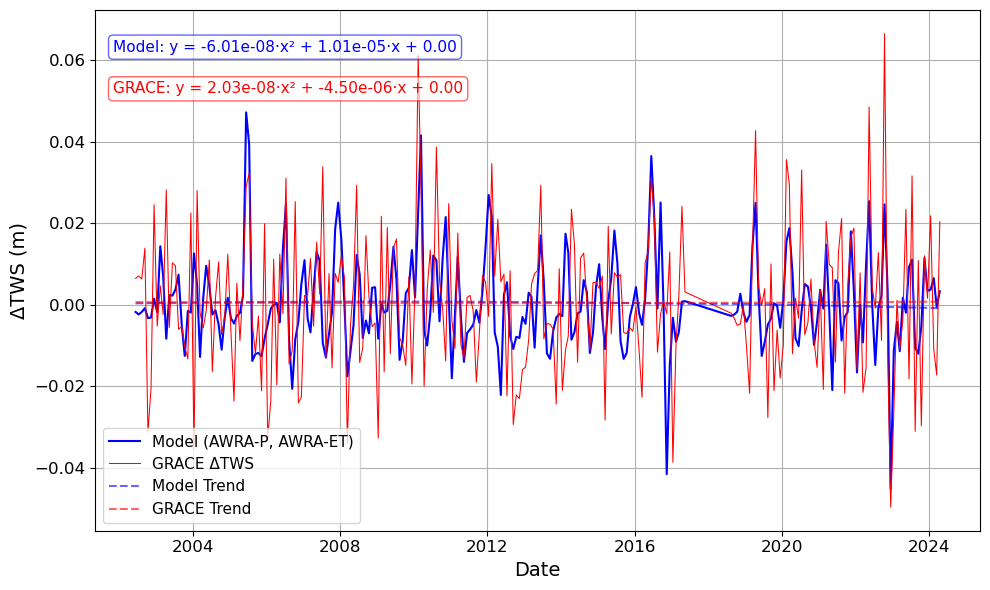

In [54]:
# NORTHWEST

# Mask out NaNs
mask = ~np.isnan(processed_data_nw["TWS_AWRA_p_AWRA_et"])

# Create time index
T = np.arange(0, len(dates[mask]))

# --- Polynomial fit: Model ---
p_model = np.polyfit(T, processed_data_nw["TWS_AWRA_p_AWRA_et"][mask], 2)
polyfit_nw_model = p_model[0]*T**2 + p_model[1]*T + p_model[2]
eq_model = f"Model: y = {p_model[0]:.2e}·x² + {p_model[1]:.2e}·x + {p_model[2]:.2f}"

# --- Polynomial fit: GRACE ---
p_grace = np.polyfit(T, processed_data_nw["GRACE_dTWS"][mask], 2)
polyfit_nw_grace = p_grace[0]*T**2 + p_grace[1]*T + p_grace[2]
eq_grace = f"GRACE: y = {p_grace[0]:.2e}·x² + {p_grace[1]:.2e}·x + {p_grace[2]:.2f}"

# --- Plotting ---
plt.figure(figsize=(10, 6))

# Raw time series
plt.plot(dates, processed_data_nw["TWS_AWRA_p_AWRA_et"], label="Model (AWRA-P, AWRA-ET)", color='blue')
plt.plot(processed_data_nw["GRACE_dTWS"].time[mask], processed_data_nw["GRACE_dTWS"][mask],
         label='GRACE ΔTWS', color='red', linewidth=0.75)

# Polynomial trends
plt.plot(dates[mask], polyfit_nw_model, '--', color='blue', alpha=0.6, label="Model Trend")
plt.plot(dates[mask], polyfit_nw_grace, '--', color='red', alpha=0.6, label="GRACE Trend")

# Annotations
plt.text(0.02, 0.92, eq_model, transform=plt.gca().transAxes, fontsize=11, color='blue',
         bbox=dict(boxstyle="round", facecolor='white', edgecolor='blue', alpha=0.6))
plt.text(0.02, 0.84, eq_grace, transform=plt.gca().transAxes, fontsize=11, color='red',
         bbox=dict(boxstyle="round", facecolor='white', edgecolor='red', alpha=0.6))

# Labels, grid, etc.
plt.xlabel('Date', fontsize=14)
plt.ylabel('ΔTWS (m)', fontsize=14)
#plt.title("Northwest Sub-basin ΔTWS Trends (AWRA-P, AWRA-ET vs GRACE)", fontsize=15)
plt.legend(fontsize=11, loc=3)

plt.tick_params(axis='both', labelsize=12)

plt.grid(True)
plt.tight_layout()
plt.show()

Y = a1*x^2 + a2*x + b
[a1, a2, b]= [-1.56499780e-07  4.07576296e-05  1.21429801e-03]


Y = a1*x^2 + a2*x + b
[a1, a2, b]= [-1.51094255e-08  3.80001692e-06  2.91810402e-04]


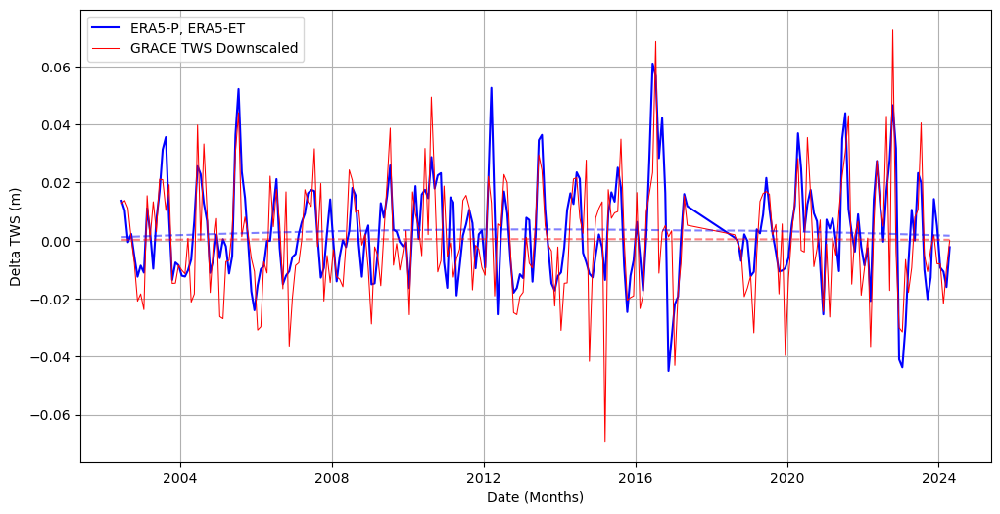

In [55]:
# SOUTHEAST

# Second-order polynomial fitting for model
mask = ~np.isnan(processed_data_se["TWS_AWRA_p_AWRA_et"])

T = np.arange(0, len(dates[mask]))

p = np.polyfit(T, processed_data_se["TWS_AWRA_p_AWRA_et"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 

polyfit_se_model = (T**2) * p[0] + T* p[1] + p[2]

print("\n")

# Second-order polynomial fitting for GRACE

T = np.arange(0, len(processed_data_se["GRACE_dTWS"].time[mask]))

p = np.polyfit(T, processed_data_se["GRACE_dTWS"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 

polyfit_se_grace = (T**2) * p[0] + T* p[1] + p[2]

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_se["TWS_AWRA_p_AWRA_et"], label = "ERA5-P, ERA5-ET", color = 'blue')
plt.plot(processed_data_se["GRACE_dTWS"].time[mask], processed_data_se["GRACE_dTWS"][mask], linewidth=0.75, label='GRACE TWS Downscaled', color='red')
plt.plot(dates[mask], polyfit_se_model, color= 'blue', linestyle = '--', alpha = 0.5)
plt.plot(processed_data_se["GRACE_dTWS"].time[mask], polyfit_se_grace, color= 'red', linestyle = '--', alpha = 0.5 )

plt.xlabel('Date (Months)')
plt.ylabel('Delta TWS (m)')
plt.legend()
plt.grid(True)
plt.show()

Y = a1*x^2 + a2*x + b
[a1, a2, b]= [-1.02609692e-08  1.51537008e-05 -2.41630645e-04]


Y = a1*x^2 + a2*x + b
[a1, a2, b]= [ 9.04928487e-08 -2.10468889e-05  1.09195094e-03]


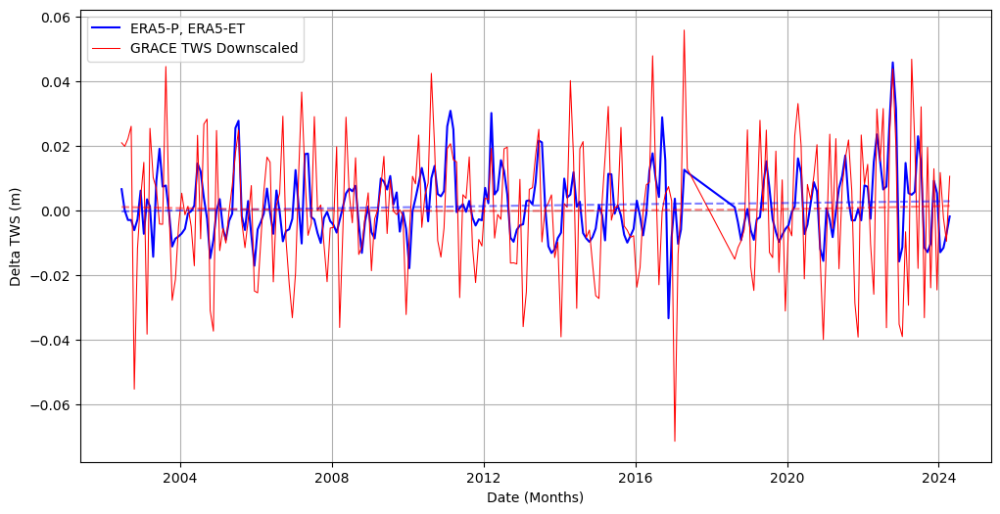

In [56]:
# SOUTHWEST

# Second-order polynomial fitting for model
mask = ~np.isnan(processed_data_sw["TWS_AWRA_p_AWRA_et"])

T = np.arange(0, len(dates[mask]))

p = np.polyfit(T, processed_data_sw["TWS_AWRA_p_AWRA_et"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 
print("\n")

polyfit_sw_model = (T**2) * p[0] + T* p[1] + p[2]

# Second-order polynomial fitting for GRACE

T = np.arange(0, len(processed_data_sw["GRACE_dTWS"].time[mask]))

p = np.polyfit(T, processed_data_sw["GRACE_dTWS"][mask], 2)
print('Y = a1*x^2 + a2*x + b')
print('[a1, a2, b]=',p) #Polynomial coefficients, highest power first. 

polyfit_sw_grace = (T**2) * p[0] + T* p[1] + p[2]

plt.figure(figsize=(12, 6))
plt.plot(dates, processed_data_sw["TWS_AWRA_p_AWRA_et"], label = "ERA5-P, ERA5-ET", color = 'blue')
plt.plot(processed_data_sw["GRACE_dTWS"].time[mask], processed_data_sw["GRACE_dTWS"][mask], linewidth=0.75, label='GRACE TWS Downscaled', color='red')
plt.plot(dates[mask], polyfit_sw_model, color= 'blue', linestyle = '--', alpha = 0.5)
plt.plot(processed_data_sw["GRACE_dTWS"].time[mask], polyfit_sw_grace, color= 'red', linestyle = '--', alpha = 0.5 )

plt.xlabel('Date (Months)')
plt.ylabel('Delta TWS (m)')
plt.legend()
plt.grid(True)
plt.show()